## Import Packages

In [30]:
import numpy as np

import scipy
from scipy.spatial import distance

from matplotlib import pyplot as plt

from sklearn.datasets import make_sparse_spd_matrix

from sklearn.preprocessing import normalize
from sklearn.covariance import GraphicalLasso

from sklearn.cluster import DBSCAN
from collections import Counter

from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics.cluster import adjusted_mutual_info_score
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

## Important Functions

In [2]:
def euclidean_dist(x, y):
    return np.sqrt(np.sum(np.square(x-y), axis=1))

In [3]:
def wasserstein_2(m1, m2, s1, s2):
    d1 = np.sum((m1 - m2)**2)
    ssqrt = scipy.linalg.sqrtm(s1)
    mul = np.matmul(np.matmul(ssqrt, s2), ssqrt)
    d2 = np.trace(s1 + s2 - 2 * scipy.linalg.sqrtm(mul))
    
    if d2 < 0:
        d2 = 0
    
    return np.sqrt(d1 + d2)

In [4]:
def add_random_noise(X, N, shift, scale):
    noised_Xs = []
    wasser_diffs = []
    while len(noised_Xs) <= N:
        #print("\rFound {} random covariances!".format(len(noised_Xs)), end="")
        noise = np.random.normal(loc=shift, scale=scale, size=X.shape)
        noised_X = X + noise
        try:
            np.linalg.cholesky(noised_X)
        except:
            continue
            
        wasser_diff = wasserstein_2(np.zeros(5), np.zeros(5), X, noised_X)
        if np.isreal(wasser_diff) and wasser_diff >= 0:
            wasser_diffs.append(wasser_diff)
            noised_Xs.append(noised_X)
        
    idx = np.argsort(wasser_diffs)
        
    return noised_Xs, wasser_diffs, idx

In [5]:
def generate_center_covs(K, D, alpha, thres=1.0):
    center_covs = []
    
    while len(center_covs) <= K:
        print("\rFound {} center covariances!".format(len(center_covs)), end="")
        center_cov =  make_sparse_spd_matrix(dim=D, alpha=alpha)
        flag = False
        for cc in center_covs:
            wasser_diff = wasserstein_2(np.zeros(5), np.zeros(5), center_cov, cc)
            if not np.isreal(wasser_diff) or wasser_diff < thres:
                flag = True
                break
        
        if not flag:
            center_covs.append(center_cov)
            
    return center_covs

In [6]:
def generate_synthetic_sequence(center_covs, subseq_clusters, subseq_lens, sample_size, scale_step):
    synthetic_sequence = []
    for subseq_cluster, subseq_len in zip(subseq_clusters, subseq_lens):
        center_cov = center_covs[subseq_cluster]
        for i in range(subseq_len):
            random_covs, wasser_diffs, idx = add_random_noise(center_cov, 100, shift=0, scale=scale_step * (i+1))
            random_cov = random_covs[idx[20]]
            random_samples = np.random.multivariate_normal(mean=[0, 0, 0, 0, 0], cov=random_cov, size=sample_size)
            synthetic_sequence.append(random_samples)
            
    return np.array(synthetic_sequence).reshape((-1,5))

In [7]:
def generate_synthetic_2D_points(center_pts, center_covs, cluster_sizes):
    pts, lbs = [], []
    for i, (ct_pt, ct_cov, cs) in enumerate(zip(center_pts, center_covs, cluster_sizes)):
        random_samples = np.random.multivariate_normal(mean=ct_pt, cov=ct_cov, size=cs)
        pts.append(random_samples)
        lbs += [i for k in range(cs)]
            
    return np.concatenate(pts, axis=0), np.array(lbs)

In [8]:
def generate_synthetic_2D_samples(center_pts, center_covs, cluster_pts, labels, step_size, alpha):
    N = len(labels)
    D = center_covs[0].shape[0]
    samples = np.zeros((N,D))
    for i, (ct_pt, ct_cov) in enumerate(zip(center_pts, center_covs)):
        pt_dst = np.sqrt(np.sum(np.square(cluster_pts - ct_pt), axis=1))
        diam = np.max(pt_dst)
        steps = int(diam // step_size)
        print(diam, steps)
        
        for k in range(steps + 1):
            #print(k, t)
            fidx = np.where((labels==i) & (pt_dst >= k * step_size) & (pt_dst < (k+1)*step_size))
            pt_bin = pt_dst[fidx]
            print(pt_bin.shape)
            random_covs, wasser_diffs, idx = add_random_noise(ct_cov, 100, shift=0, scale=alpha*(k+1))
            random_cov = random_covs[idx[20]]
            random_sample = np.random.multivariate_normal(mean=[0,0,0,0,0], cov=random_cov, size=pt_bin.shape[0])
            samples[fidx] = random_sample
            
        print("Finished Cluster {}".format(i))
            
    return samples

In [9]:
def compute_relative_distance(cov_seq):
    rel_wasser_diffs = []

    for i in range(len(cov_seq) - 1):
        (mean1, cov1), (mean2, cov2) = cov_seq[i], cov_seq[1+1]
        rel_wasser_diffs.append(wasserstein_2(mean1, mean2, cov1, cov2))
        
    return rel_wasser_diffs

In [10]:
def scan_by_cluster(base_cov, cov_seq):
    rel_wasser_diffs = []
    
    #base_mean, base_cov = cov_seq[base_model_idx]
    base_mean = np.zeros(5)
    for i in range(len(cov_seq)):
        (mean, cov) = cov_seq[i]
        rel_wasser_diffs.append(wasserstein_2(base_mean, mean, base_cov, cov))
        
    return rel_wasser_diffs

In [11]:
def construct_wasser_dist_matrix(cov_seq):
    N = len(cov_seq)
    print(N)

    wasser_dist_matrix = np.zeros((N, N))

    for i in range(N):
        m1, s1 = cov_seq[i]
        for j in range(i+1,N):
            m2, s2 = cov_seq[j]
            wd = wasserstein_2(m1, m2, s1, s2)
            wasser_dist_matrix[i,j] = wd
            wasser_dist_matrix[j,i] = wd
        print("\rFinished {}".format(i), end="")
    
    return wasser_dist_matrix

In [12]:
def construct_spatial_dist_matrix(loc_seq):
    N = len(loc_seq)
    print(N)
    
    spatial_dist_matrix = np.zeros((N, N))

    for i in range(N):
        for j in range(i+1,N):
            sd = np.abs(loc_seq[i] - loc_seq[j])
            spatial_dist_matrix[i,j] = sd
            spatial_dist_matrix[j,i] = sd

    return spatial_dist_matrix

In [13]:
def construct_2D_spatial_dist_matrix(pts):
    N = pts.shape[0]
    print(N)
    
    spatial_dist_matrix = np.zeros((N,N))

    for i, pt in enumerate(pts):
        dst = np.sqrt(np.sum(np.square(pt-pts), axis=1))
        spatial_dist_matrix[i,:] = dst

    return spatial_dist_matrix

In [14]:
def construct_feature_dist_matrix(feat_seq):
    N = len(feat_seq)
    cosine_dist_matrix = np.zeros((N, N))

    for i in range(N):
        for j in range(i+1,N):
            v1, v2 = feat_seq[i], feat_seq[j]
            cd = distance.cosine(v1, v2)
            cosine_dist_matrix[i,j] = cd
            cosine_dist_matrix[j,i] = cd
        
    return cosine_dist_matrix

In [15]:
def compute_evaluation_metrics(ground_truth, cluster_result):
    return adjusted_rand_score(ground_truth, cluster_result), adjusted_mutual_info_score(ground_truth, cluster_result)

## 1-Dimensional Data

In [16]:
center_cov = make_sparse_spd_matrix(dim=5, alpha=0.5)

random_covs = []
random_observations = []
wasser_diffs = []

for i in range(1000):
    cov = make_sparse_spd_matrix(dim=5, alpha=0.5)
    obs = np.random.multivariate_normal(mean=[0, 0, 0, 0, 0], cov=cov, size=50)
    
    random_covs.append(cov)
    random_observations.append(obs)
    
    wasser_diffs.append(wasserstein_2(np.zeros(5), np.zeros(5), center_cov, cov))

In [17]:
idx = np.argsort(wasser_diffs)

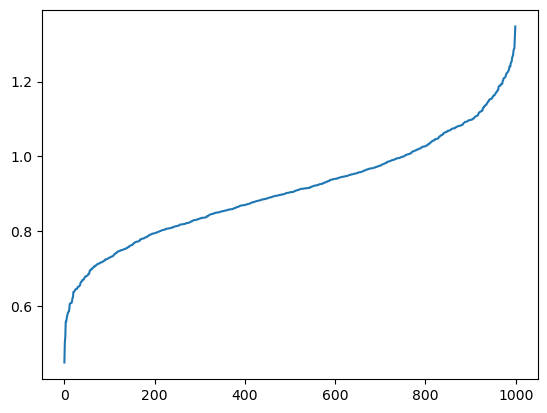

In [18]:
plt.plot(np.arange(len(idx)), np.array(wasser_diffs)[idx])

In [19]:
rel_wasser_diffs = []

for i, _ in enumerate(idx[200:600]):
    cov1, cov2 = random_covs[idx[i]], random_covs[idx[1+1]]
    rel_wasser_diffs.append(wasserstein_2(np.zeros(5), np.zeros(5), cov1, cov2))

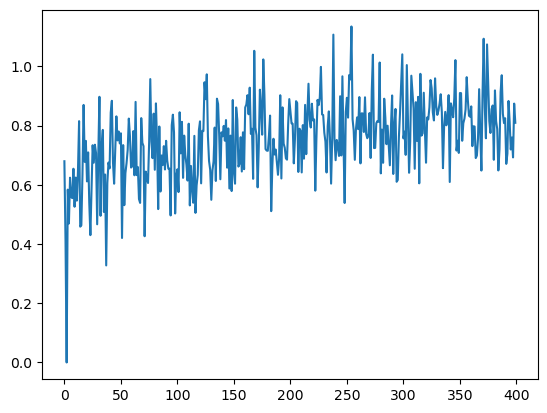

In [20]:
plt.plot(np.arange(len(rel_wasser_diffs)), np.array(rel_wasser_diffs))

In [21]:
def random_shuffle(X, N, shift, scale):
    noised_Xs = []
    wasser_diffs = []
    while len(noised_Xs) <= N:
        print("\rFound {} random covariances!".format(len(noised_Xs)), end="")
        noise = np.random.normal(loc=shift, scale=scale, size=X.shape)
        noised_X = X + noise
        try:
            np.linalg.cholesky(noised_X)
        except:
            continue
            
        wasser_diff = wasserstein_2(np.zeros(5), np.zeros(5), X, noised_X)
        if np.isreal(wasser_diff) and wasser_diff > 0:
            wasser_diffs.append(wasser_diff)
            noised_Xs.append(noised_X)
        
    idx = np.argsort(wasser_diffs)
        
    return noised_Xs, wasser_diffs, idx

In [15]:
center_cov =  make_sparse_spd_matrix(dim=5, alpha=0.3)

Found 100 random covariances!

C:\Users\zhang\AppData\Local\Temp\ipykernel_38288\1948581284.py:7: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(d1 + d2)


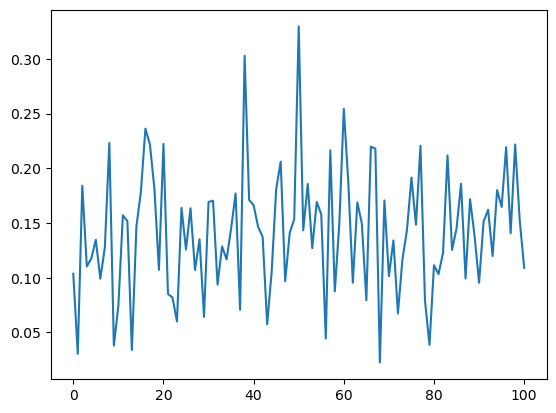

In [16]:
random_covs, wasser_diffs, idx = random_shuffle(center_cov, 100, shift=0, scale=0.1)
plt.plot(np.arange(len(wasser_diffs)), np.array(wasser_diffs))

Found 100 random covariances!

C:\Users\zhang\AppData\Local\Temp\ipykernel_38288\1948581284.py:7: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(d1 + d2)


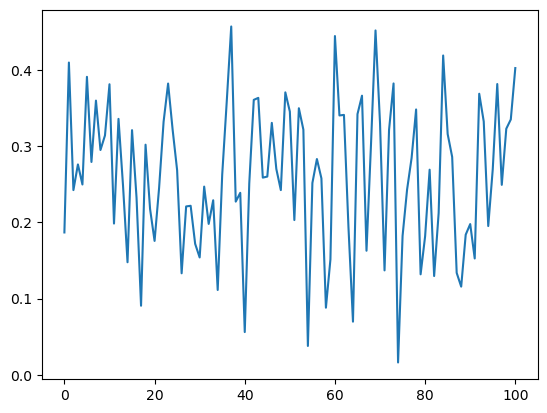

In [17]:
random_covs, wasser_diffs, idx = random_shuffle(center_cov, 100, shift=0, scale=0.2)
plt.plot(np.arange(len(wasser_diffs)), np.array(wasser_diffs))

Found 100 random covariances!

C:\Users\zhang\AppData\Local\Temp\ipykernel_38288\1948581284.py:7: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(d1 + d2)


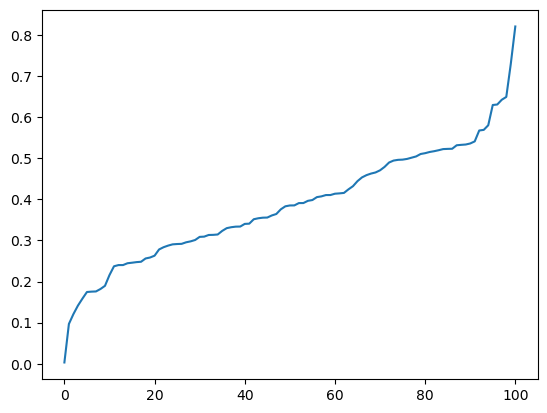

In [21]:
random_covs, wasser_diffs, idx = random_shuffle(center_cov, 100, shift=0, scale=0.3)
plt.plot(np.arange(len(wasser_diffs)), np.array(wasser_diffs)[idx])

In [19]:
def generate_center_covs(K):
    center_covs = []
    
    while len(center_covs) <= K:
        print("\rFound {} center covariances!".format(len(center_covs)), end="")
        center_cov =  make_sparse_spd_matrix(dim=5, alpha=0.3)
        flag = False
        for cc in center_covs:
            wasser_diff = wasserstein_2(np.zeros(5), np.zeros(5), center_cov, cc)
            if not np.isreal(wasser_diff) or wasser_diff < 1.0:
                flag = True
                break
        
        if not flag:
            center_covs.append(center_cov)
            
    return center_covs

In [23]:
center_covs = generate_center_covs(5, 5, 0.7)

Found 5 center covariances!

In [24]:
def generate_synthetic_sequence(center_covs, subseq_clusters, subseq_lens, sample_size, scale_step):
    synthetic_sequence = []
    for subseq_cluster, subseq_len in zip(subseq_clusters, subseq_lens):
        center_cov = center_covs[subseq_cluster]
        for i in range(subseq_len):
            random_covs, wasser_diffs, idx = random_shuffle(center_cov, 100, shift=0, scale=scale_step * (i+1))
            random_cov = random_covs[idx[20]]
            random_samples = np.random.multivariate_normal(mean=[0, 0, 0, 0, 0], cov=random_cov, size=sample_size)
            synthetic_sequence.append(random_samples)
            
    return np.array(synthetic_sequence).reshape((-1,5))

In [25]:
subseq_clusters = [0,1,2,1,3,4,2,0,3]
subseq_lens = [10,20,15,30,25,50,10,15,15]

In [26]:
center_covs[0]

array([[ 1.40229546, -0.56049665,  0.19230356,  0.        , -0.29688208],
       [-0.56049665,  1.        ,  0.        ,  0.        ,  0.        ],
       [ 0.19230356,  0.        ,  1.41957218,  0.        , -0.64774391],
       [ 0.        ,  0.        ,  0.        ,  1.        ,  0.        ],
       [-0.29688208,  0.        , -0.64774391,  0.        ,  1.        ]])

In [27]:
synthetic_sequence = generate_synthetic_sequence(center_covs, [0,1,2,1,3,4,2,0,3], [10,20,15,30,25,50,10,15,15], 50, 0.005)

Found 100 random covariances!

/var/folders/73/_b1jlprj7sl70bmh21bnk5dc0000gn/T/ipykernel_54705/879832735.py:8: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  random_samples = np.random.multivariate_normal(mean=[0, 0, 0, 0, 0], cov=random_cov, size=sample_size)


Found 100 random covariances!

In [28]:
synthetic_sequence.shape

(9500, 5)

In [31]:
glasso = GraphicalLasso(alpha=0.01, max_iter=1000)

estimated_models = []

for i in range(190):
    data = synthetic_sequence[i*50:(i+1)*50,:]
    fit = glasso.fit(data)
    estimated_models.append((fit.location_, fit.covariance_))

In [32]:
rel_wasser_diffs = compute_relative_distance(estimated_models)

In [33]:
rel_wasser_diffs

[0.7030440218202387,
 0.7444278023075246,
 9.18569267238524e-08,
 0.7338860915874974,
 0.6137040779478178,
 0.6977599164487648,
 0.7088995815208954,
 0.7897878880573581,
 0.7261249250263464,
 0.5932101102955635,
 1.3061926047315497,
 1.2791987098928754,
 1.3592410473944876,
 1.2280740642286465,
 1.2804245456464045,
 1.400034745016771,
 1.256196495818247,
 1.3089669173712586,
 1.3455129209593948,
 1.3888728916077273,
 1.2613731510800794,
 1.130042318020661,
 1.622400849230929,
 1.3189238396239902,
 1.3667285521332946,
 1.1797905690300872,
 1.4256790930119054,
 1.3179232186803724,
 1.4469377699928143,
 1.1748943113102566,
 1.4493414888355352,
 1.3355991365905941,
 1.470347977316575,
 1.2012412272846908,
 1.2921142331743365,
 1.5339644889134363,
 1.648088507099822,
 1.4011431239896295,
 1.1700995939094583,
 1.3349034871755772,
 1.4196157479057017,
 1.4690594443119893,
 1.4159693530510284,
 1.4219037944241526,
 1.5174445001731331,
 1.4585539564378256,
 1.2104370277823202,
 1.36969270356063

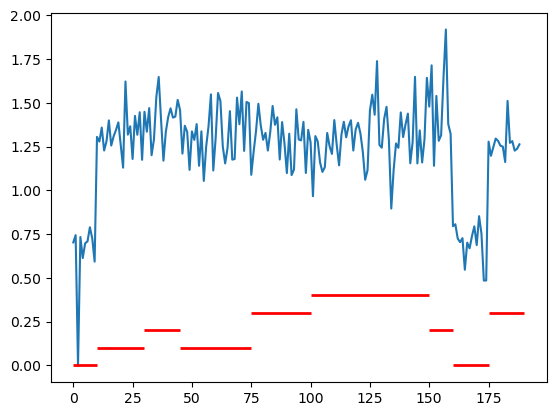

In [34]:
plt.plot(rel_wasser_diffs)
start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    plt.hlines(y=0.1*i, xmin=start, xmax=end, linewidth=2, color='r')
    start += l

In [57]:
scan_wasser_diffs = scan_by_cluster(0, estimated_models)

C:\Users\zhang\AppData\Local\Temp\ipykernel_38288\1948581284.py:7: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(d1 + d2)


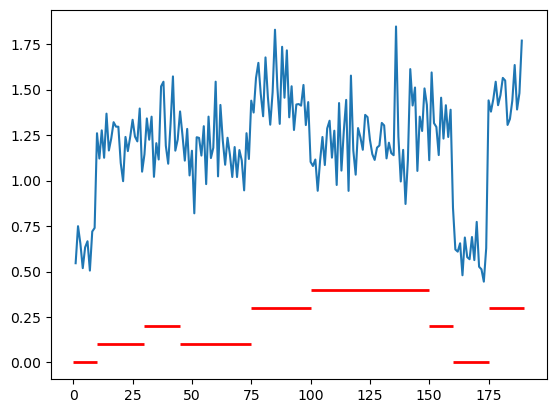

In [58]:
plt.plot(scan_wasser_diffs)
start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    plt.hlines(y=0.1*i, xmin=start, xmax=end, linewidth=2, color='r')
    start += l

## Weighted Distance Method on 1-D Synthetic Data

In [8]:
synthetic_sequence = np.loadtxt("commercial-vehicle-data.txt", delimiter=",")

In [9]:
synthetic_sequence.shape

(16641, 5)

In [10]:
ground_truth = np.loadtxt("commercial-vehicle-label.txt", delimiter=",")

In [11]:
ground_truth.shape

(16641,)

In [12]:
16641 // 20

832

In [13]:
glasso = GraphicalLasso(alpha=0.01, max_iter=1000)

estimated_models_1D = []

for i in range(832):
    data = synthetic_sequence[i*20:(i+1)*20,:]
    fit = glasso.fit(data)
    estimated_models_1D.append((fit.location_, fit.covariance_))

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 1.223e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -4.887e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -4.739e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -3.948e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarn

In [14]:
wasser_dist_matrix = construct_wasser_dist_matrix(estimated_models_1D)

832
Finished 831

In [19]:
spatial_dist_matrix = construct_spatial_dist_matrix(range(832))

832


In [258]:
extended_spatial_dist_matrix = construct_spatial_matrix(range(9450))

9450


In [243]:
synthetic_sequence.shape

(9500, 5)

In [17]:
feature_dist_matrix = construct_feature_dist_matrix(synthetic_sequence)

KeyboardInterrupt: 

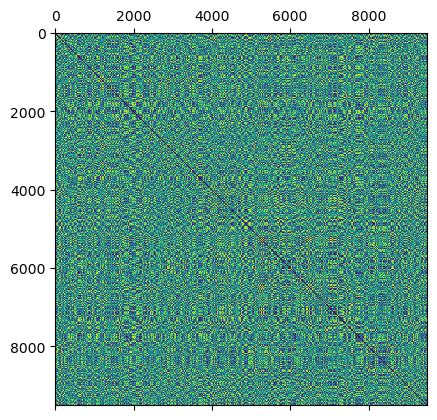

In [245]:
plt.matshow(feature_dist_matrix)

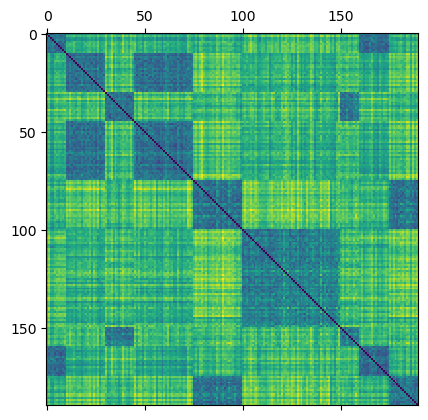

In [707]:
plt.matshow(wasser_dist_matrix)

(array([137138., 104408.,  78666., 136780., 109982.,  60796.,  42786.,
         18658.,   2848.,    162.]),
 array([0.        , 0.73906395, 1.47812791, 2.21719186, 2.95625581,
        3.69531976, 4.43438372, 5.17344767, 5.91251162, 6.65157557,
        7.39063953]),
 <BarContainer object of 10 artists>)

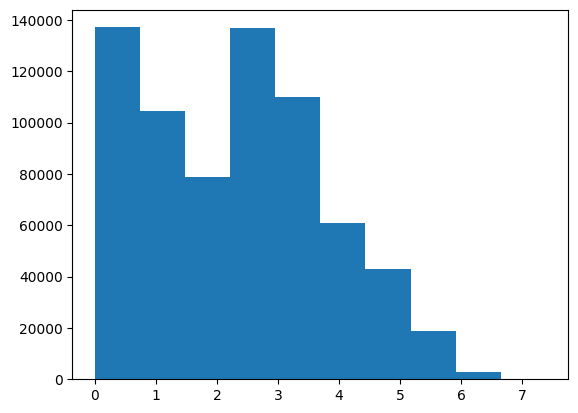

In [24]:
plt.hist(wasser_dist_matrix.flatten())

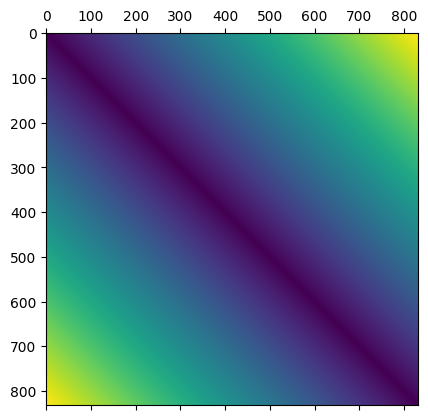

In [22]:
plt.matshow(spatial_dist_matrix)

In [25]:
lam = 1e-2

weighted_dist_matrix = wasser_dist_matrix + lam * spatial_dist_matrix

weighted_clustering = DBSCAN(eps=0.7, min_samples=2, metric="precomputed").fit(weighted_dist_matrix)
weighted_clustering.labels_

# plt.figure(figsize=(60,30))
# plt.scatter(range(832), weighted_clustering.labels_)
# start = 0
# end = 0
# for i, l in zip(subseq_clusters, subseq_lens):
#     end += l
#     plt.hlines(y=0.1*i, xmin=start, xmax=end, linewidth=2, color='r')
#     start += l

array([ 0,  0,  0,  0,  0,  0, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  1,
        1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  3, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  4,  4, -1, -1, -1,  5,  5,
        5, -1,  4,  4,  4

In [26]:
expanded_labels = np.array([[r for i in range(20)] for r in weighted_clustering.labels_]).flatten()

In [27]:
expanded_labels.shape

(16640,)

In [28]:
adjusted_mutual_info_score(ground_truth[:-1], expanded_labels)

0.5541630170502361

In [31]:
results = []

for lam in np.arange(1e-3, 5e-2, 1e-3):
    for i in np.arange(0.4,0.8,0.1):
        for j in np.arange(2,10,10):
            weighted_dist_matrix = wasser_dist_matrix + lam * spatial_dist_matrix
            weighted_clustering = DBSCAN(eps=i, min_samples=j, metric="precomputed").fit(weighted_dist_matrix)
            expanded_labels = np.array([[r for i in range(20)] for r in weighted_clustering.labels_]).flatten()
            ari, nmi = compute_evaluation_metrics(ground_truth[:-1], expanded_labels)
            print(lam, ari, nmi, i, j)
            results.append((ari, nmi, (i, j, lam)))

0.001 0.5239244677789617 0.5345449551531727 0.4 2
0.001 0.4512636692292452 0.4609560746479153 0.5 2
0.001 0.47225828148476784 0.5180296816256433 0.6 2
0.001 0.42602245486742885 0.48044026445443305 0.7 2
0.002 0.5611514736349011 0.6017933532240192 0.4 2
0.002 0.4996503718695447 0.5029915772581315 0.5 2
0.002 0.45310283659543427 0.46754240313908696 0.6 2
0.002 0.42363788271843084 0.4482146119716174 0.7 2
0.003 0.5613349937106324 0.6030931577919443 0.4 2
0.003 0.5646561890621591 0.5986813597798577 0.5 2
0.003 0.46227218664069025 0.4736495806683152 0.6 2
0.003 0.4429160633136971 0.460081420552289 0.7 2
0.004 0.5613349937106324 0.6030931577919443 0.4 2
0.004 0.5657601644906174 0.6010153842169018 0.5 2
0.004 0.4715206859284625 0.4798274466095735 0.6 2
0.004 0.4514754059622168 0.4667206634191832 0.7 2
0.005 0.5564034382943022 0.5985744468350752 0.4 2
0.005 0.5659456022042169 0.6023212609441421 0.5 2
0.005 0.5565427654296302 0.570542195208953 0.6 2
0.005 0.457539208406351 0.470380856154354 0.7

0.039 0.5526082107839451 0.5844972059734527 0.6 2
0.039 0.5647384659440663 0.5901762788572193 0.7 2
0.04 0.536973695848522 0.5947365978562983 0.4 2
0.04 0.5472859222360064 0.5857325576345812 0.5 2
0.04 0.5526082107839451 0.5844972059734527 0.6 2
0.04 0.5626732897833466 0.5890451400356846 0.7 2
0.041 0.536973695848522 0.5947365978562983 0.4 2
0.041 0.5472859222360064 0.5857325576345812 0.5 2
0.041 0.5526082107839451 0.5844972059734527 0.6 2
0.041 0.5626732897833466 0.5890451400356846 0.7 2
0.042 0.536973695848522 0.5947365978562983 0.4 2
0.042 0.5475020708247527 0.5895850891381262 0.5 2
0.042 0.5526082107839451 0.5844972059734527 0.6 2
0.042 0.5626732897833466 0.5890451400356846 0.7 2
0.043000000000000003 0.5351307565833248 0.5936708255884292 0.4 2
0.043000000000000003 0.5475020708247527 0.5895850891381262 0.5 2
0.043000000000000003 0.5526082107839451 0.5844972059734527 0.6 2
0.043000000000000003 0.5626732897833466 0.5890451400356846 0.7 2
0.044000000000000004 0.5351307565833248 0.59367

In [ ]:
adjusted_mutual_info_score(ground_truth, wasser_clustering.labels_)

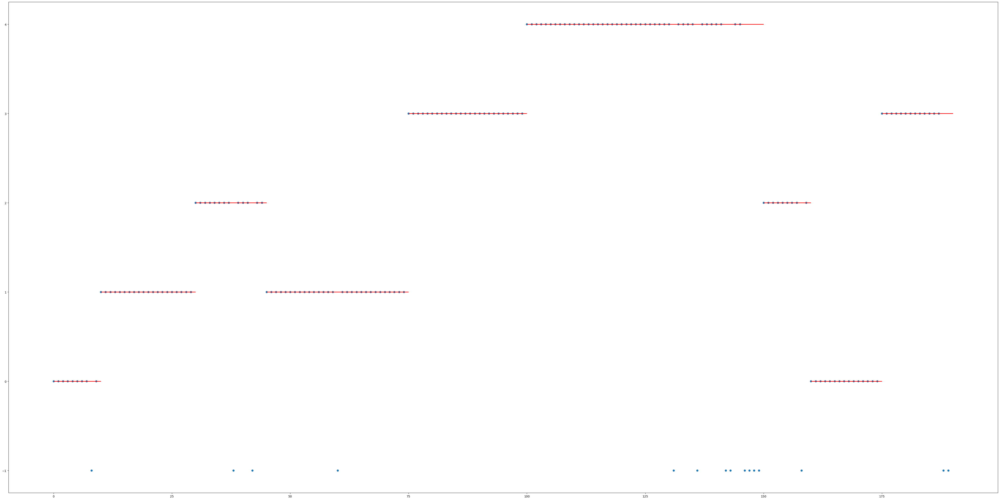

In [212]:
plt.figure(figsize=(60,30))
plt.scatter(range(190), weighted_clustering.labels_)
start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    plt.hlines(y=i, xmin=start, xmax=end, linewidth=2, color='r')
    start += l

(array([  190.,    34.,  1506.,  4134.,  5648., 12142.,  9508.,  2524.,
          368.,    46.]),
 array([0.        , 0.22299639, 0.44599279, 0.66898918, 0.89198558,
        1.11498197, 1.33797837, 1.56097476, 1.78397116, 2.00696755,
        2.22996395]),
 <BarContainer object of 10 artists>)

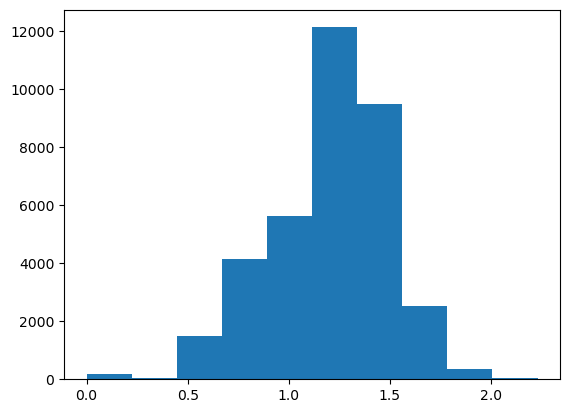

In [230]:
plt.hist(wasser_dist_matrix.flatten())

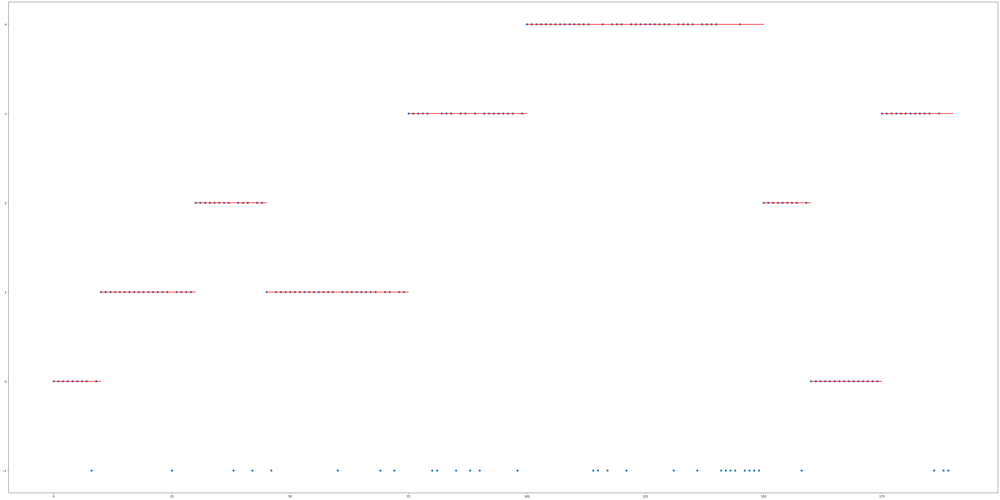

In [240]:
wasser_clustering = DBSCAN(eps=0.6, min_samples=3, metric="precomputed").fit(wasser_dist_matrix)
wasser_clustering.labels_

plt.figure(figsize=(60,30))
plt.scatter(range(190), wasser_clustering.labels_)
start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    plt.hlines(y=i, xmin=start, xmax=end, linewidth=2, color='r')
    start += l

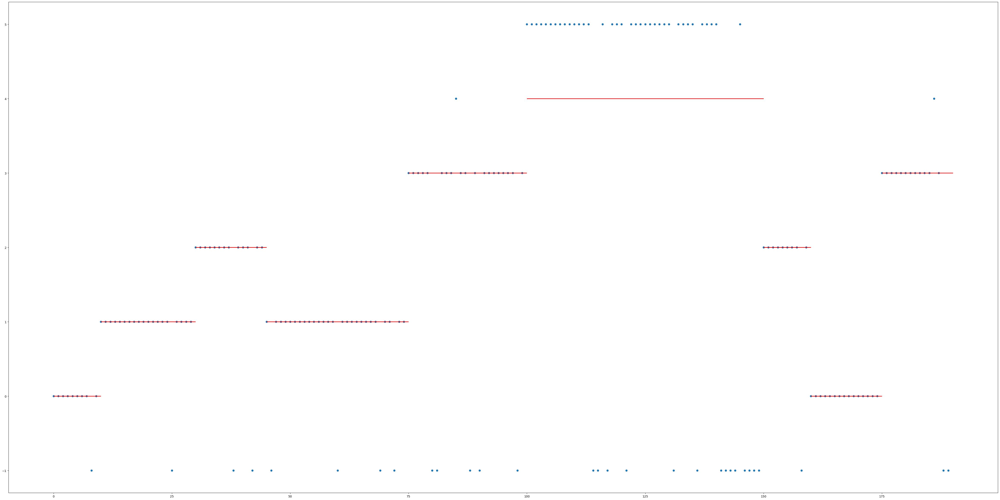

In [223]:
plt.figure(figsize=(60,30))
plt.scatter(range(190), wasser_clustering.labels_)
start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    plt.hlines(y=i, xmin=start, xmax=end, linewidth=2, color='r')
    start += l

In [241]:
adjusted_mutual_info_score(ground_truth, wasser_clustering.labels_)

0.7980039083999744

In [242]:
adjusted_rand_score(ground_truth, wasser_clustering.labels_)

0.7403845379326544

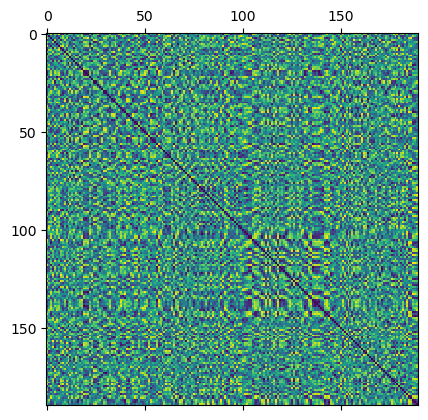

In [107]:
plt.matshow(feature_dist_matrix)

(array([ 3238368.,  7633746., 10199334., 11681452., 12369362., 12370868.,
        11678634., 10210850.,  7632432.,  3234954.]),
 array([0.        , 0.19999484, 0.39998969, 0.59998453, 0.79997937,
        0.99997422, 1.19996906, 1.3999639 , 1.59995875, 1.79995359,
        1.99994843]),
 <BarContainer object of 10 artists>)

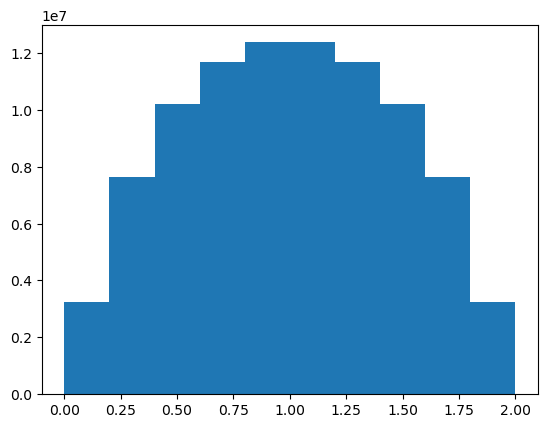

In [246]:
plt.hist(feature_dist_matrix.flatten())

In [252]:
extended_wasser_dist_matrix = np.load("sliding_window_synthetic_wasser_matrix.npz")["data"]

In [253]:
extended_wasser_dist_matrix.shape

(9450, 9450)

(array([1.0469200e+05, 5.1241800e+05, 6.3392820e+06, 1.1205586e+07,
        2.2229638e+07, 3.3753796e+07, 1.3191406e+07, 1.7882980e+06,
        1.6869600e+05, 8.6880000e+03]),
 array([0.        , 0.24170055, 0.48340109, 0.72510164, 0.96680219,
        1.20850274, 1.45020328, 1.69190383, 1.93360438, 2.17530493,
        2.41700547]),
 <BarContainer object of 10 artists>)

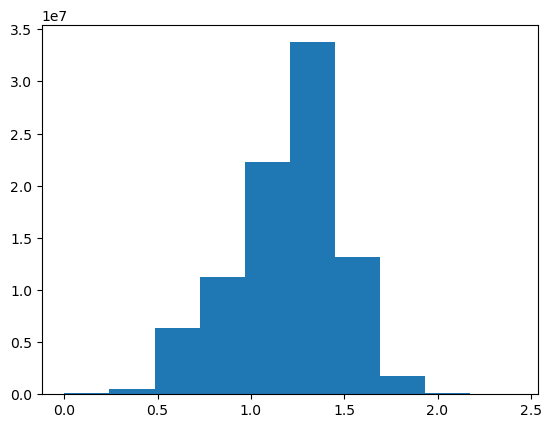

In [254]:
plt.hist(extended_wasser_dist_matrix.flatten())

Counter({-1: 9450})


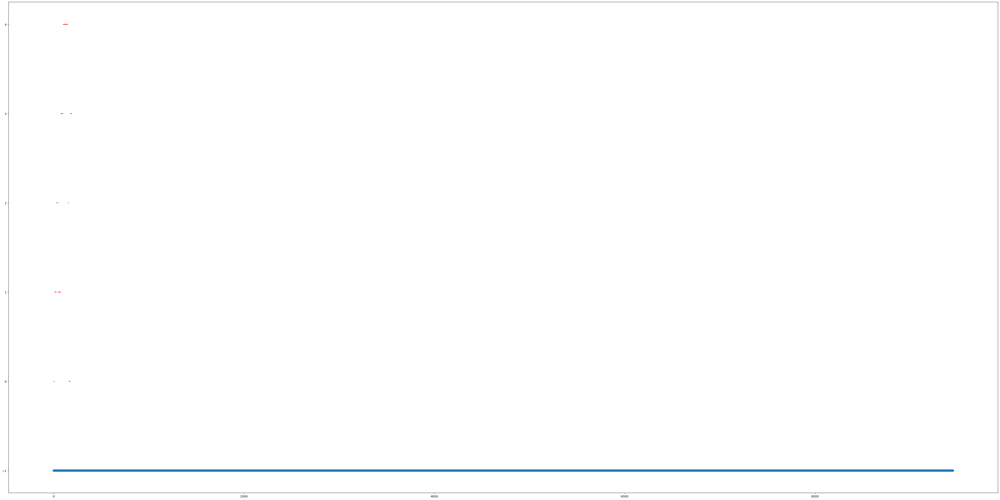

In [263]:
lam = 1

weighted_feature_dist_matrix = extended_wasser_dist_matrix[:9450,:9450] + lam * extended_spatial_dist_matrix

weighted_feature_clustering = DBSCAN(eps=1.5, min_samples=150, metric="precomputed").fit(weighted_feature_dist_matrix)

print(Counter(weighted_feature_clustering.labels_))

plt.figure(figsize=(60,30))
plt.scatter(range(9450), weighted_feature_clustering.labels_)
start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    plt.hlines(y=i, xmin=start, xmax=end, linewidth=2, color='r')
    start += l

In [249]:
Counter(feature_clustering.labels_)

Counter({0: 9500})

In [215]:
ground_truth = []

start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    ground_truth += [i for k in range(l)]
    start += l

In [83]:
adjusted_rand_score(ground_truth, weighted_clustering.labels_)

0.8915152906532745

In [90]:
adjusted_rand_score(ground_truth, wasser_clustering.labels_)

0.7445289421519176

In [105]:
adjusted_rand_score(ground_truth, feature_clustering.labels_)

0.0005433692592397666

In [114]:
o = open("synthetic_data.txt", "w")

for d in synthetic_sequence:
    o.write(",".join([str(i) for i in d]) + "\n")
    
o.close()

In [910]:
f = open("ticc_synthetic_result_ws_100.txt", "r")

ticc_labels = []

for l in f:
    if l.rstrip() == "nan":
        ticc_labels.append(-1)
    else:
        ticc_labels.append(int(float(l.rstrip())))
        
f.close()

In [911]:
len(ticc_labels)

9500

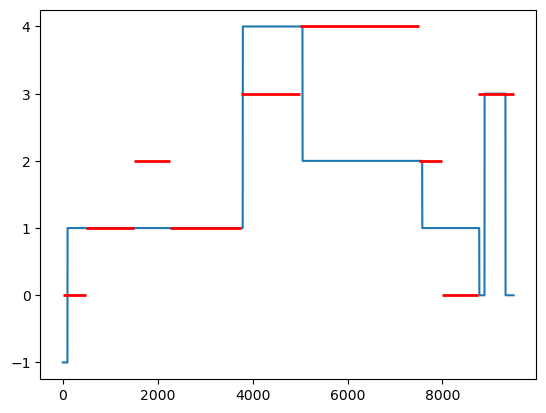

In [912]:
plt.plot(ticc_labels)

start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    plt.hlines(y=i, xmin=start*50, xmax=end*50, linewidth=2, color='r')
    start += l

In [913]:
extended_ground_truth = []

start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    extended_ground_truth += [i for k in range(l*50)]
    start += l

In [914]:
adjusted_rand_score(extended_ground_truth, ticc_labels)

0.513636717137472

In [915]:
adjusted_mutual_info_score(extended_ground_truth, ticc_labels)

0.6719139422133498

In [217]:
f = open("ticc_synthetic_result_beta_0.txt", "r")

ticc_labels = []

for l in f:
    if l.rstrip() == "nan":
        ticc_labels.append(-1)
    else:
        ticc_labels.append(int(float(l.rstrip())))
        
f.close()

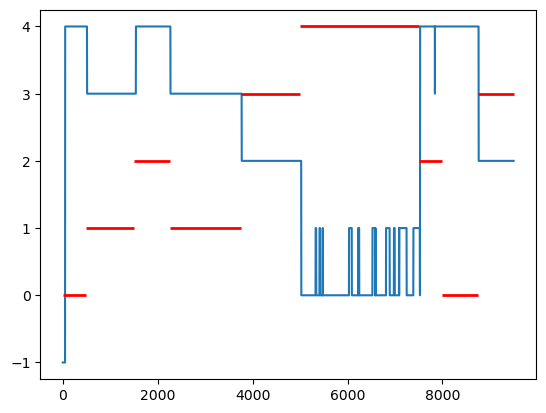

In [218]:
plt.plot(ticc_labels)

start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    plt.hlines(y=i, xmin=start*50, xmax=end*50, linewidth=2, color='r')
    start += l

In [219]:
adjusted_rand_score(extended_ground_truth, ticc_labels)

0.801079043978583

In [220]:
adjusted_mutual_info_score(extended_ground_truth, ticc_labels)

0.8395485836220818

## 1D Grid Search

In [711]:
ground_truth = []

start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    ground_truth += [i for k in range(l)]
    start += l

In [718]:
extended_ground_truth = []

start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    extended_ground_truth += [i for k in range(l*50)]
    start += l

In [713]:
sliding_wasser_dist_matrix = np.load("sliding_window_synthetic_wasser_matrix.npz")["data"]

In [715]:
sliding_spatial_dist_matrix = construct_spatial_dist_matrix(range(9450))

9450


In [725]:
for i in np.arange(0.4,0.8,0.1):
    for j in np.arange(10,100,10):
        sliding_wasser_clustering = DBSCAN(eps=i, min_samples=j, metric="precomputed").fit(sliding_wasser_dist_matrix)
        ari, nmi = compute_evaluation_metrics(extended_ground_truth[:9450], sliding_wasser_clustering.labels_)
        print(ari, nmi, i, j)
        results.append((ari, nmi, (i, j, lam)))

0.0 0.0 0.4 10
0.7056479147454637 0.7719003989998253 0.4 20
0.6575134774544088 0.7065113693766468 0.4 30
0.2744000323197649 0.5220841935864059 0.4 40
0.08277388869253158 0.3911046648926047 0.4 50
0.02220318012627296 0.2916810401475147 0.4 60
-0.0038966148094872837 0.17851030802291012 0.4 70
-0.005166140810636092 0.12261021463273566 0.4 80
-0.007073014789910477 0.05890976656434132 0.4 90
0.0 0.0 0.5 10
0.0 0.0 0.5 20
5.1032384100137345e-05 0.001382486572630312 0.5 30
0.7352337061775015 0.7940719368791321 0.5 40
0.8638287415578754 0.8456452600056608 0.5 50
0.8347556794920555 0.8217422630320427 0.5 60
0.7906608888035007 0.7899345473022463 0.5 70
0.7461287999653082 0.7634187443349753 0.5 80
0.6997358871292462 0.7411038094327435 0.5 90
0.0 0.0 0.6 10
0.0 0.0 0.6 20
0.0 0.0 0.6 30
0.0 0.0 0.6 40
-0.0011276720261766942 0.008237727330074562 0.6 50
-0.001821166348113538 0.014230556762985505 0.6 60
0.2241953714932587 0.44550047050964375 0.6 70
0.22413298004551138 0.44515554742115476 0.6 80
0.224

In [730]:
for i in np.arange(0.6,0.7,0.01):
    for j in np.arange(90,150,10):
        weighted_dist_matrix = sliding_wasser_dist_matrix + 1e-5 * sliding_spatial_dist_matrix
        weighted_clustering = DBSCAN(eps=i, min_samples=j, metric="precomputed").fit(weighted_dist_matrix)
        ari, nmi = compute_evaluation_metrics(extended_ground_truth[:9450], weighted_clustering.labels_)
        print(ari, nmi, i, j)
        results.append((ari, nmi, (i, j, lam)))

-0.0009920610554552524 0.007520437307165024 0.6 50
-0.002262604687144505 0.018974994893399683 0.6 60
0.2244112365581575 0.44387638967062815 0.6 70
0.5579296340344561 0.7188776017520132 0.6 80
0.7505237458099103 0.8201666389937875 0.6 90
0.7489622243850245 0.8166906464353261 0.6 100
0.74573501501132 0.8127232426752252 0.6 110
0.8969773645077876 0.8708488327611913 0.6 120
0.8920542422841494 0.8675486832448047 0.6 130
0.8891751966104396 0.8640247816523247 0.6 140
-0.0009832467149283712 0.0066822063787872745 0.61 50
-0.0017842073190082368 0.013887185211641591 0.61 60
0.2241434569802231 0.4438707143213893 0.61 70
0.5593803688063381 0.7199065581195524 0.61 80
0.5587263211173933 0.7163624853481806 0.61 90
0.7504823666242733 0.8208625504389779 0.61 100
0.7507042414513205 0.8185729938133032 0.61 110
0.7502211176127958 0.8172498418208818 0.61 120
0.9049875456019 0.8795932464489407 0.61 130
0.8994387715057264 0.8737507255983836 0.61 140
-2.543100031829025e-05 -3.1737950184569736e-05 0.62 50
-0.00

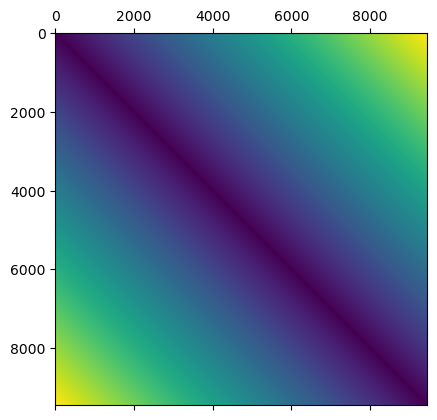

In [727]:
plt.matshow(sliding_spatial_dist_matrix)

(array([16958970., 15182370., 13396320., 11610270.,  9824220.,  8038170.,
         6252120.,  4466070.,  2680020.,   893970.]),
 array([   0. ,  944.9, 1889.8, 2834.7, 3779.6, 4724.5, 5669.4, 6614.3,
        7559.2, 8504.1, 9449. ]),
 <BarContainer object of 10 artists>)

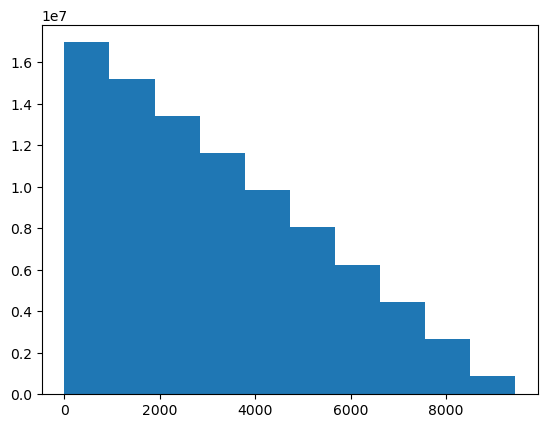

In [728]:
plt.hist(sliding_spatial_dist_matrix.flatten())

## Sliding Window Method

In [29]:
glasso = GraphicalLasso(alpha=0.01, max_iter=1000)

sliding_estimated_models = []

for i in range(16621):
    data = synthetic_sequence[i:i+20,:]
    fit = glasso.fit(data)
    sliding_estimated_models.append((fit.location_, fit.covariance_))

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 7.307e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -4.193e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 6.781e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 4.393e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarnin

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -6.749e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -8.206e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -3.505e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -3.389e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWar

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 6.945e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 1.159e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 1.328e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 8.293e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -5.646e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -5.894e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -1.554e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -8.349e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWar

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 4.430e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 2.321e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 4.628e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -1.164e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarnin

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 1.614e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 1.241e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 2.128e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 5.597e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -4.593e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 4.624e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 1.409e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -2.241e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarni

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -2.844e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -2.536e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -2.358e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -1.131e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWar

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -1.148e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -6.524e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 1.538e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 2.041e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarni

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -8.284e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -2.323e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 1.079e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -1.565e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarn

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -3.587e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 2.119e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 2.909e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 4.064e-04
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarnin

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 1.498e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -2.204e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 3.097e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 1.208e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarnin

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 2.088e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -2.002e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 2.176e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: 4.663e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarnin

C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -1.099e-02
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -9.457e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -7.774e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWarning: graphical_lasso: did not converge after 1000 iteration: dual gap: -9.917e-03
  warnings.warn(
C:\Users\zhang\anaconda3\envs\density-based-mrf\Lib\site-packages\sklearn\covariance\_graph_lasso.py:297: ConvergenceWar

In [ ]:
wasser_dist_matrix = construct_wasser_dist_matrix(sliding_estimated_models)

16621
Finished 1025

In [127]:
#np.savez("sliding_window_synthetic_wasser_matrix", data=wasser_dist_matrix)

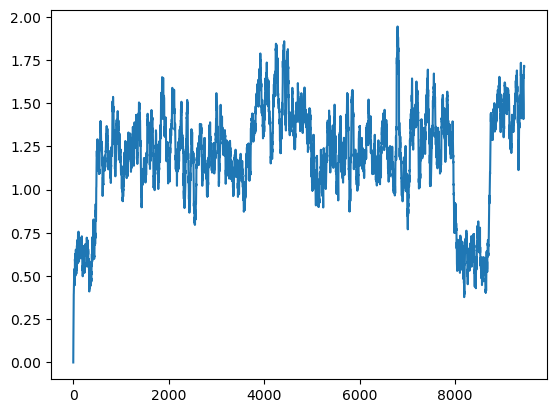

In [152]:
plt.plot(wasser_dist_matrix[0,:])

(array([1.0469200e+05, 5.1241800e+05, 6.3392820e+06, 1.1205586e+07,
        2.2229638e+07, 3.3753796e+07, 1.3191406e+07, 1.7882980e+06,
        1.6869600e+05, 8.6880000e+03]),
 array([0.        , 0.24170055, 0.48340109, 0.72510164, 0.96680219,
        1.20850274, 1.45020328, 1.69190383, 1.93360438, 2.17530493,
        2.41700547]),
 <BarContainer object of 10 artists>)

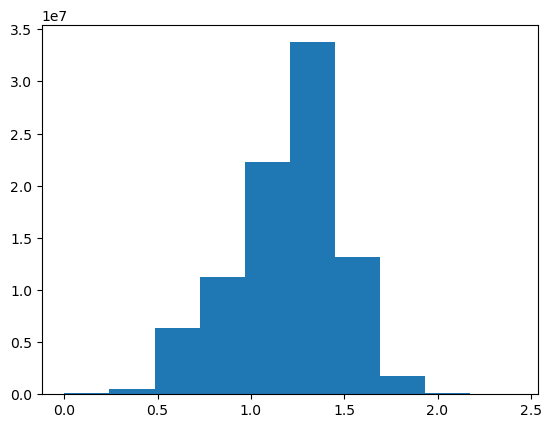

In [131]:
plt.hist(wasser_dist_matrix.flatten())

In [160]:
wasser_clustering = DBSCAN(eps=0.6, min_samples=360, metric="precomputed").fit(wasser_dist_matrix)
wasser_clustering.labels_

array([ 0,  0,  0, ..., -1, -1,  3], dtype=int64)

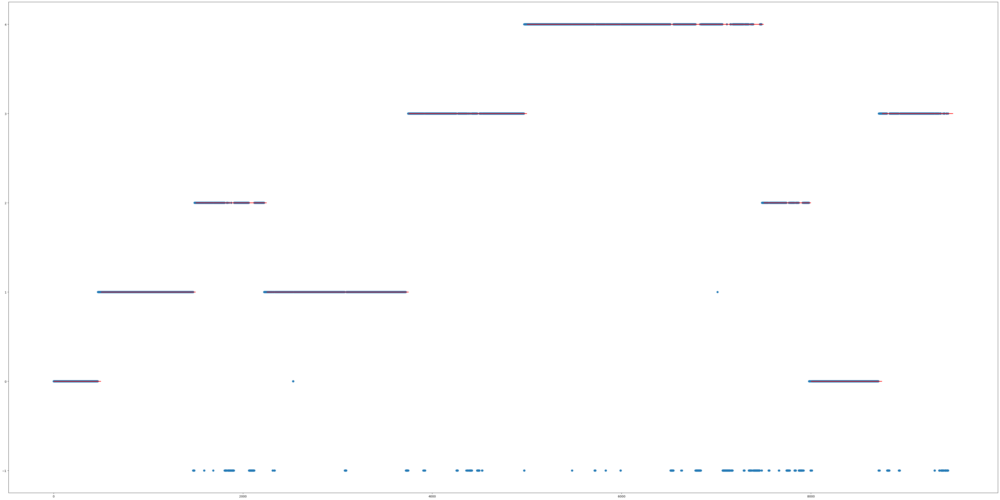

In [175]:
plt.figure(figsize=(60,30))
plt.scatter(range(9450), wasser_clustering.labels_)
start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    plt.hlines(y=i, xmin=start*50, xmax=end*50, linewidth=2, color='r')
    start += l

In [162]:
adjusted_rand_score(extended_ground_truth[:9450], wasser_clustering.labels_)

0.8465125322800499

In [163]:
spatial_dist_matrix = construct_spatial_dist_matrix(range(9450))

9450


(array([1.0849400e+05, 5.0340200e+05, 6.1961480e+06, 1.1019948e+07,
        2.0898726e+07, 3.4639772e+07, 1.3958220e+07, 1.8038400e+06,
        1.6660600e+05, 7.3440000e+03]),
 array([0.        , 0.24641955, 0.49283909, 0.73925864, 0.98567819,
        1.23209774, 1.47851728, 1.72493683, 1.97135638, 2.21777593,
        2.46419547]),
 <BarContainer object of 10 artists>)

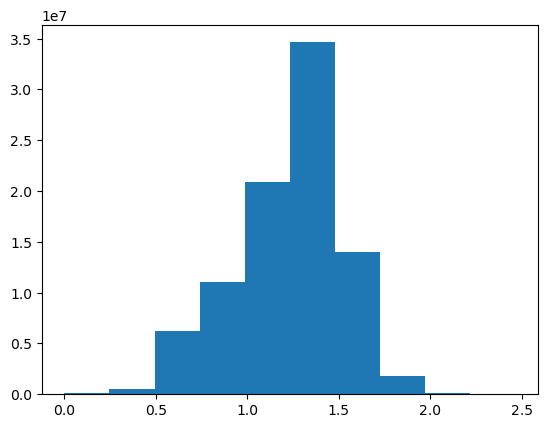

In [191]:
plt.hist(weighted_dist_matrix.flatten())

In [199]:
lam = 1e-5

weighted_dist_matrix = wasser_dist_matrix + lam * spatial_dist_matrix

weighted_clustering = DBSCAN(eps=0.6, min_samples=150, metric="precomputed").fit(weighted_dist_matrix)
weighted_clustering.labels_

array([ 0,  0,  0, ..., -1, -1, -1], dtype=int64)

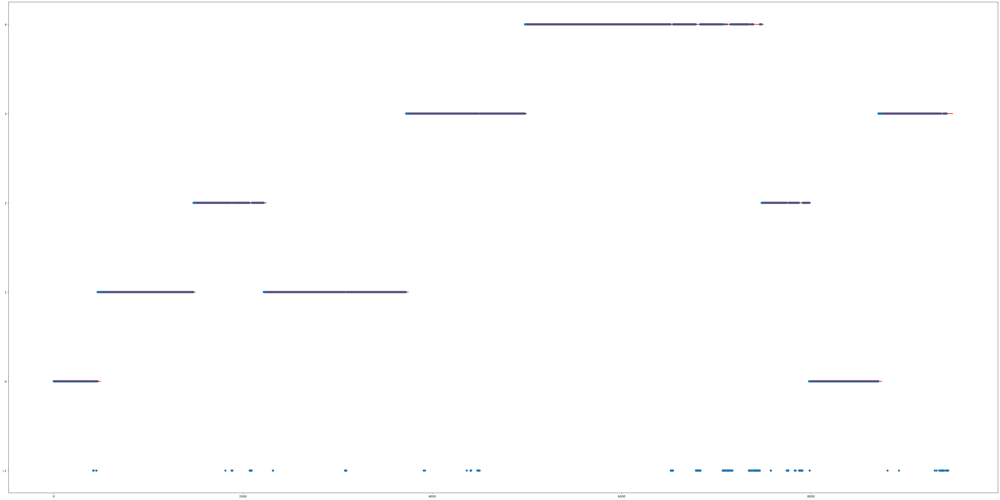

In [200]:
plt.figure(figsize=(60,30))
plt.scatter(range(9450), weighted_clustering.labels_)
start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    plt.hlines(y=i, xmin=start*50, xmax=end*50, linewidth=2, color='r')
    start += l

In [201]:
adjusted_rand_score(extended_ground_truth[:9450], weighted_clustering.labels_)

0.884675573577027

In [213]:
adjusted_mutual_info_score(extended_ground_truth[:9450], weighted_clustering.labels_)

ValueError: Found input variables with inconsistent numbers of samples: [9450, 190]

In [216]:
adjusted_mutual_info_score(ground_truth, weighted_clustering.labels_)

0.8878749681665256

## Baseline: Pure Feature Based

In [ ]:
plt.hist()

In [740]:
for i in np.arange(0.01,0.1,0.01):
    for j in np.arange(50,100,10):
        dbscan_clustering = DBSCAN(eps=i, min_samples=j, metric="cosine").fit(synthetic_sequence)
        ari, nmi = compute_evaluation_metrics(extended_ground_truth, dbscan_clustering.labels_)
        print(ari, nmi, i, j)
        results.append((ari, nmi, (i, j)))

0.0 0.0 0.01 50
0.0 0.0 0.01 60
0.0 0.0 0.01 70
0.0 0.0 0.01 80
0.0 0.0 0.01 90
0.0 0.0 0.02 50
0.0 0.0 0.02 60
0.0 0.0 0.02 70
0.0 0.0 0.02 80
0.0 0.0 0.02 90
0.0 0.0 0.03 50
0.0 0.0 0.03 60
0.0 0.0 0.03 70
0.0 0.0 0.03 80
0.0 0.0 0.03 90
0.0 0.0 0.04 50
0.0 0.0 0.04 60
0.0 0.0 0.04 70
0.0 0.0 0.04 80
0.0 0.0 0.04 90
-0.007586202403761334 0.03278186119457811 0.05 50
0.00040102179695820597 0.0018481423460994667 0.05 60
0.0 0.0 0.05 70
0.0 0.0 0.05 80
0.0 0.0 0.05 90
0.02442325419997277 0.02500569829228167 0.060000000000000005 50
0.0015796651250327238 0.019797660477618845 0.060000000000000005 60
-0.008330636065798645 0.026226997421358544 0.060000000000000005 70
0.0006477060678041528 0.0023358962660193785 0.060000000000000005 80
0.0 0.0 0.060000000000000005 90
0.008940355820365195 0.016033626173842512 0.06999999999999999 50
0.02072054926944527 0.021501712829006873 0.06999999999999999 60
0.022220581601060243 0.020471793630209904 0.06999999999999999 70
0.0020294105706187915 0.0197330667170

In [864]:
for i in np.arange(0.06,0.15,0.01):
    for j in np.arange(50,100,10):
        dbscan_clustering = DBSCAN(eps=i, min_samples=j, metric="cosine").fit(synthetic_map)
        ari, nmi = compute_evaluation_metrics(lbs, dbscan_clustering.labels_)
        print(ari, nmi, i, j)
        results.append((ari, nmi, (i, j)))

0.0016882464622035133 0.01302669376126513 0.06 50
0.0 0.0 0.06 60
0.0 0.0 0.06 70
0.0 0.0 0.06 80
0.0 0.0 0.06 90
0.020687210577071888 0.05315279655021529 0.06999999999999999 50
0.003131405779145219 0.02337014893468939 0.06999999999999999 60
0.0 0.0 0.06999999999999999 70
0.0 0.0 0.06999999999999999 80
0.0 0.0 0.06999999999999999 90
0.006752853423190954 0.010933989094174737 0.07999999999999999 50
0.02906639517747608 0.05141282500856438 0.07999999999999999 60
0.007248960706522057 0.04705143185570057 0.07999999999999999 70
0.00139835049537893 0.005476984653140484 0.07999999999999999 80
0.0 0.0 0.07999999999999999 90
-0.002199475755924614 0.009595747146006108 0.08999999999999998 50
0.004721842958542659 0.011624233278910804 0.08999999999999998 60
0.03685441860822236 0.05381499500167 0.08999999999999998 70
0.013117180457546245 0.05989199214840872 0.08999999999999998 80
0.0034371925720526036 0.024273510279043526 0.08999999999999998 90
-0.0027332048109648655 0.007391062421844717 0.09999999999

(array([1097861., 2663674., 3661150., 4267700., 4551210., 4557742.,
        4273138., 3665402., 2667970., 1095554.]),
 array([0.        , 0.19996248, 0.39992496, 0.59988744, 0.79984992,
        0.9998124 , 1.19977488, 1.39973736, 1.59969984, 1.79966232,
        1.9996248 ]),
 <BarContainer object of 10 artists>)

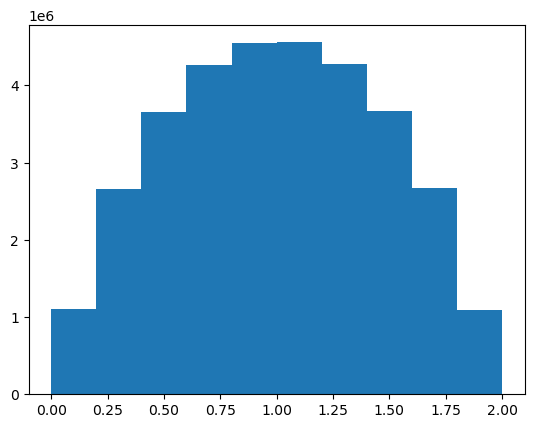

In [861]:
plt.hist(cosine_2D_dist_matrix.flatten())

In [858]:
dbscan_clustering = DBSCAN(eps=0.1, min_samples=20, metric="precomputed").fit(cosine_2D_dist_matrix)

In [859]:
compute_evaluation_metrics(lbs, dbscan_clustering.labels_)

(1.940073650855766e-05, 0.0005158303249558677)

In [732]:
kmeans_clustering = KMeans(n_clusters=5, random_state=0, n_init="auto").fit(synthetic_sequence)
kmeans_clustering.labels_

print(Counter(kmeans_clustering.labels_))

Counter({3: 2155, 2: 2076, 0: 2015, 4: 1694, 1: 1560})


In [733]:
ari, nmi = compute_evaluation_metrics(extended_ground_truth, kmeans_clustering.labels_)
print(ari, nmi)

0.0132656734805769 0.016354531829481024


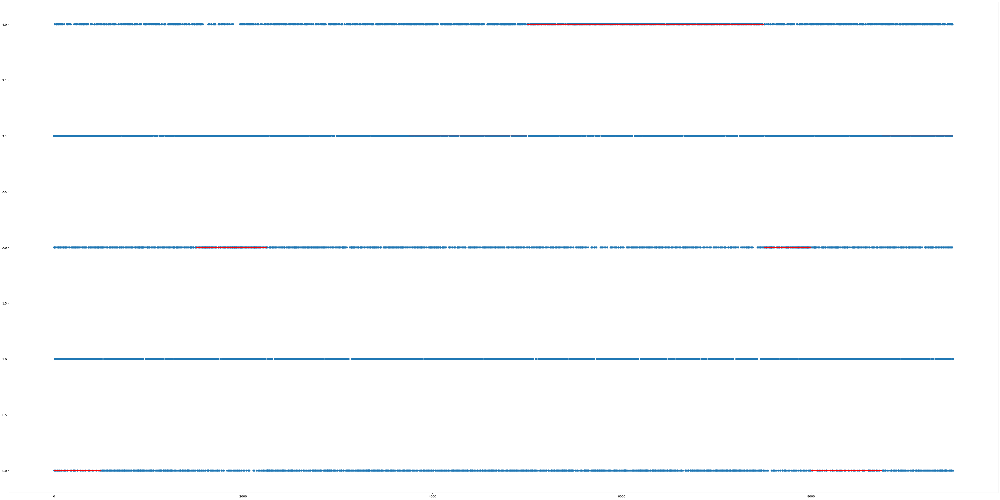

In [275]:
plt.figure(figsize=(60,30))
plt.scatter(range(9500), kmeans_clustering.labels_)
start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    plt.hlines(y=i, xmin=start*50, xmax=end*50, linewidth=2, color='r')
    start += l

In [285]:
compute_evaluation_metrics(extended_ground_truth, kmeans_clustering.labels_)

(0.010335136610576116, 0.016878154683170127)

In [807]:
gm_clustering = GaussianMixture(n_components=5, init_params="k-means++").fit(synthetic_sequence)
gm_labels = gm_clustering.predict(synthetic_sequence)

compute_evaluation_metrics(extended_ground_truth, gm_labels)

(0.00419833861245526, 0.015383419926571527)

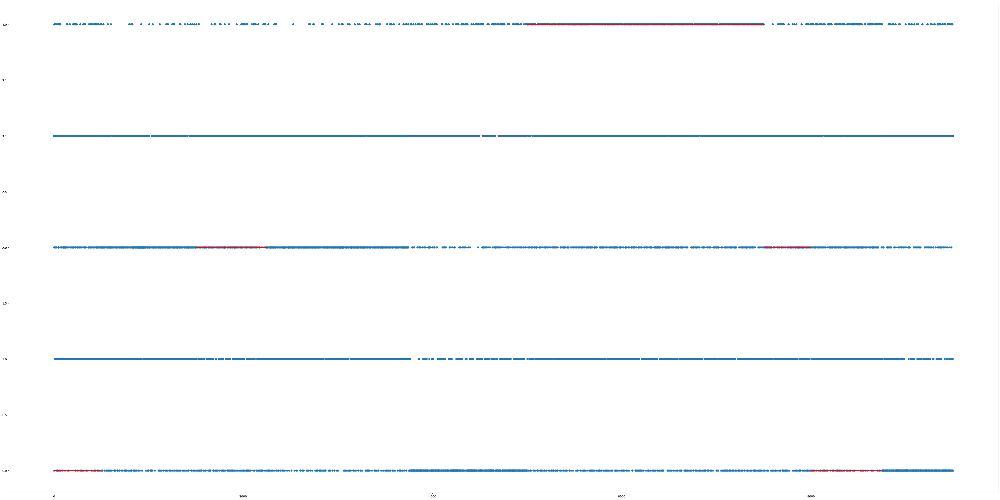

In [290]:
plt.figure(figsize=(60,30))
plt.scatter(range(9500), gm_labels)
start = 0
end = 0
for i, l in zip(subseq_clusters, subseq_lens):
    end += l
    plt.hlines(y=i, xmin=start*50, xmax=end*50, linewidth=2, color='r')
    start += l

In [291]:
compute_evaluation_metrics(extended_ground_truth, gm_labels)

(0.07824241086294961, 0.09542704969175776)

In [810]:
np.savez("synthetic_sequence", data=synthetic_sequence)

## DTW

In [811]:
dtw_labels = np.load("dtw-clustering-result.npz")["data"]
compute_evaluation_metrics(extended_ground_truth, dtw_labels)

(0.002157290181808299, 0.005058128900297509)

## HDBSCAN

In [870]:
hdbscan_labels = np.load("hdbscan-2d-clustering-result.npz")["data"]
compute_evaluation_metrics(lbs, hdbscan_labels)

(0.0018111676810679874, 0.018776062112936587)

In [817]:
cosine_dist_matrix = construct_feature_dist_matrix(synthetic_sequence)

In [818]:
np.savez("synthetic_sequence_cosine_dist_matrix", data=cosine_dist_matrix)

## 2-D Synthetic Dataset

In [35]:
K = 5
D = 5
alpha = 0.005

In [50]:
cluster_sizes = np.random.randint(500,2000,size=5)

In [51]:
cluster_sizes

array([1397, 1192, 1570, 1973, 1763])

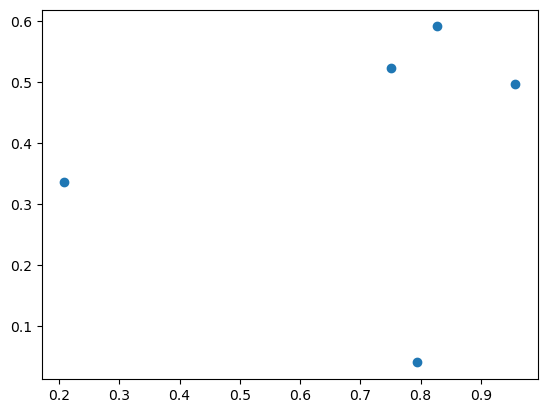

In [52]:
cluster_centers = np.random.rand(5,2)
plt.scatter(cluster_centers[:,0], cluster_centers[:,1])

In [53]:
center_covs = generate_center_covs(K, D, 0.7, 1.0)

Found 5 center covariances!

In [54]:
pos_covs = generate_center_covs(K, 2, 0.0, 0.1)

Found 5 center covariances!

In [55]:
pts, lbs = generate_synthetic_2D_points(10*cluster_centers, pos_covs, cluster_sizes)

In [56]:
Counter(lbs)

Counter({3: 1973, 4: 1763, 2: 1570, 0: 1397, 1: 1192})

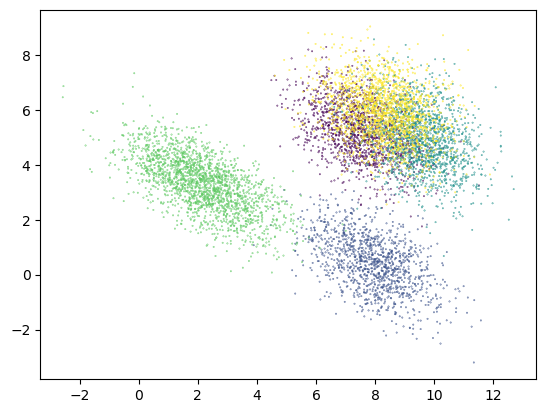

In [57]:
plt.scatter(pts[:,0], pts[:,1],c=lbs, s=0.1)

Found 5 center covariances!

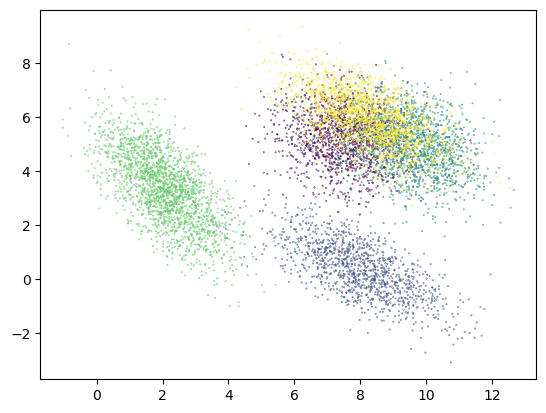

In [58]:
pos_covs = generate_center_covs(K, 2, 0.0, 0.1)
pts, lbs = generate_synthetic_2D_points(10*cluster_centers, pos_covs, cluster_sizes)
plt.scatter(pts[:,0], pts[:,1],c=lbs, s=0.1)

In [59]:
sanity_map = generate_synthetic_2D_samples(10*cluster_centers, center_covs, pts, lbs, 1, 1e-5)

9.053076761063032 9
(565,)
(645,)
(170,)
(16,)
(1,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 0
12.090191360464274 12
(431,)
(491,)
(203,)
(48,)
(19,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 1
11.061678167121718 11
(584,)
(757,)


/var/folders/73/_b1jlprj7sl70bmh21bnk5dc0000gn/T/ipykernel_54705/707590718.py:18: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  random_sample = np.random.multivariate_normal(mean=[0,0,0,0,0], cov=random_cov, size=pt_bin.shape[0])


(202,)
(26,)
(1,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 2
11.041925197068169 11
(736,)
(774,)
(360,)
(84,)
(18,)
(0,)
(1,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 3
9.537938967383456 9
(670,)
(745,)
(280,)
(58,)
(10,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 4


In [61]:
sanity_map.shape

(7895, 5)

In [67]:
import pandas as pd
import geopandas as gpd

In [69]:
df = pd.DataFrame(
    {
        "attr_0": sanity_map[:,0],
        "attr_1": sanity_map[:,1],
        "attr_2": sanity_map[:,2],
        "attr_3": sanity_map[:,3],
        "attr_4": sanity_map[:,4]
    }
)

In [73]:
np.savez("synthetic-2D", xs=pts[:,0], ys=pts[:,1], lbs=lbs)

In [71]:
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(x=pts[:,0], y=pts[:,1])
)

In [72]:
gdf.to_file("synthetic-2D.shp")

In [578]:
gm_clustering = GaussianMixture(n_components=5, random_state=10).fit(sanity_map)
gm_labels = gm_clustering.predict(sanity_map)
Counter(gm_labels)

Counter({2: 1639, 1: 1125, 0: 2017, 3: 507, 4: 413})

In [579]:
compute_evaluation_metrics(lbs, gm_labels)

(0.04421080120275687, 0.05974498723971569)

In [273]:
gm_clustering = GaussianMixture(n_components=5, random_state=10).fit(pts)
gm_labels = gm_clustering.predict(pts)
Counter(gm_labels)

Counter({0: 1291, 3: 1488, 4: 1289, 1: 761, 2: 872})

In [274]:
compute_evaluation_metrics(lbs, gm_labels)

(0.9090793947104165, 0.8893928493562187)

In [289]:
estimated_models = [(np.zeros(5), center_cov) for center_cov in center_covs]

rel_wasser_diffs = scan_by_cluster(1, estimated_models)

print(rel_wasser_diffs)

[1.1481587362842922, 0.0, 1.4400048599774826, 1.3948918101414085, 1.2681677152349653, 1.1233252087697145]


In [348]:
glasso = GraphicalLasso(alpha=0.01, max_iter=1000)

radius = 3
estimated_models = []

for i, pt in enumerate(pts):
    pt_dst = euclidean_dist(pt, pts)
    data = sanity_map[pt_dst<radius]
    if data.shape[0] < 50:
        data = sanity_map[pt_dst<2*radius]
    #print(data.shape)
    fit = glasso.fit(data)
    estimated_models.append((fit.location_, fit.covariance_))

C:\Users\zhang\AppData\Local\Temp\ipykernel_6240\1686814156.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('RdYlBu')


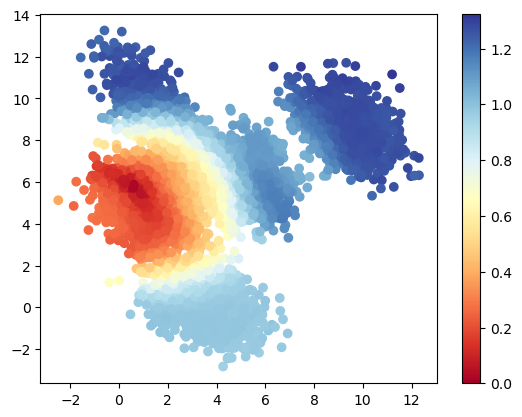

In [349]:
rel_wasser_diffs = scan_by_cluster(2000, estimated_models)
cm = plt.cm.get_cmap('RdYlBu')
sc = plt.scatter(pts[:,0], pts[:,1],c=rel_wasser_diffs,cmap=cm)
plt.colorbar(sc)

In [311]:
gm_clustering = GaussianMixture(n_components=5, random_state=10).fit(sanity_map)
gm_labels = gm_clustering.predict(sanity_map)
Counter(gm_labels)

Counter({0: 1116, 4: 1113, 3: 1268, 2: 1251, 1: 953})

In [312]:
compute_evaluation_metrics(lbs, gm_labels)

(-0.0004353508186114579, -0.00033844704225386324)

In [580]:
synthetic_map = generate_synthetic_2D_samples(10*cluster_centers, center_covs, pts, lbs, 1, alpha)

13.808165028784801 13
(479,)
(607,)
(190,)
(14,)
(2,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 0
11.718256811010887 11
(574,)
(697,)


C:\Users\zhang\AppData\Local\Temp\ipykernel_6240\707590718.py:18: RuntimeWarning: covariance is not positive-semidefinite.
  random_sample = np.random.multivariate_normal(mean=[0,0,0,0,0], cov=random_cov, size=pt_bin.shape[0])


(183,)
(20,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 1
13.202802050815595 13
(331,)
(350,)
(107,)
(23,)
(4,)
(1,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 2
9.645500336576452 9
(482,)
(544,)
(188,)
(36,)
(1,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 3
13.32064805147651 13
(353,)
(361,)
(122,)
(31,)
(1,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 4


In [508]:
synthetic_map.shape

(5701, 5)

In [581]:
gm_clustering = GaussianMixture(n_components=5, random_state=10).fit(synthetic_map)
gm_labels = gm_clustering.predict(synthetic_map)
Counter(gm_labels)

Counter({2: 1620, 3: 1040, 4: 925, 0: 953, 1: 1163})

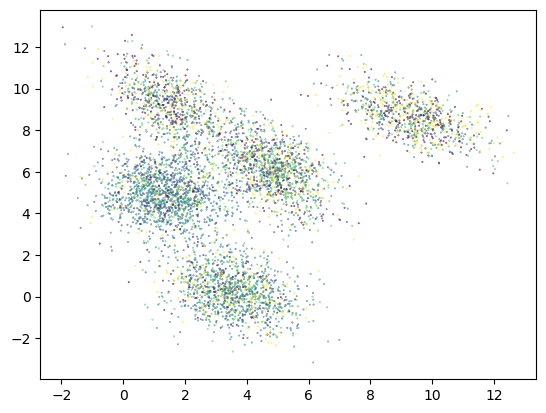

In [582]:
plt.scatter(pts[:,0], pts[:,1], c=gm_labels, s=0.1)

In [583]:
compute_evaluation_metrics(lbs, gm_labels)

(0.03957585682919088, 0.043044454802671724)

In [846]:
glasso = GraphicalLasso(alpha=0.01, max_iter=1000)

radius = 3
estimated_models = []

for i, pt in enumerate(pts):
    pt_dst = euclidean_dist(pt, pts)
    data = synthetic_map[pt_dst<radius]
    if data.shape[0] < 50:
        data = synthetic_map[pt_dst<2*radius]
    #print(data.shape)
    fit = glasso.fit(data)
    estimated_models.append((fit.location_, fit.covariance_))

In [847]:
len(estimated_models)

5701

C:\Users\zhang\AppData\Local\Temp\ipykernel_6240\3223619098.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('RdYlBu')


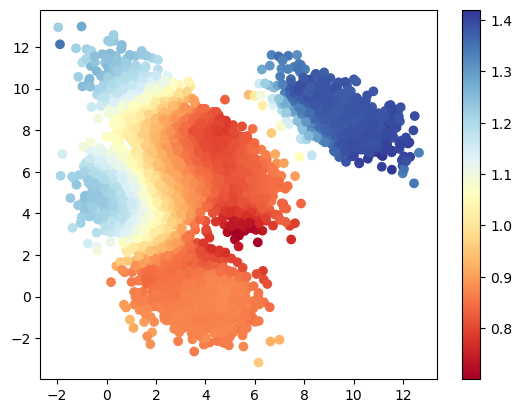

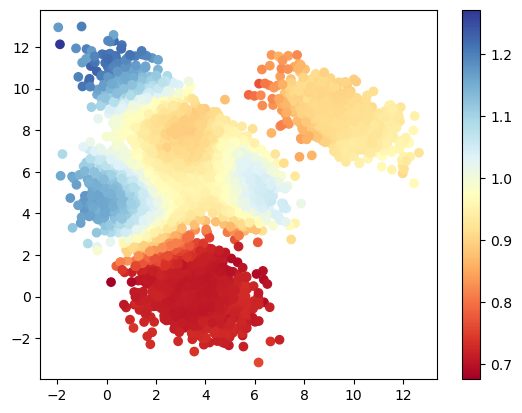

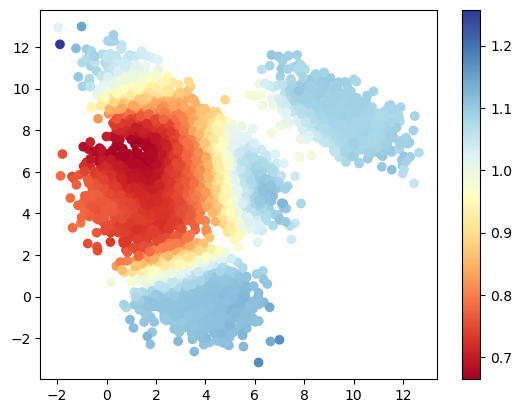

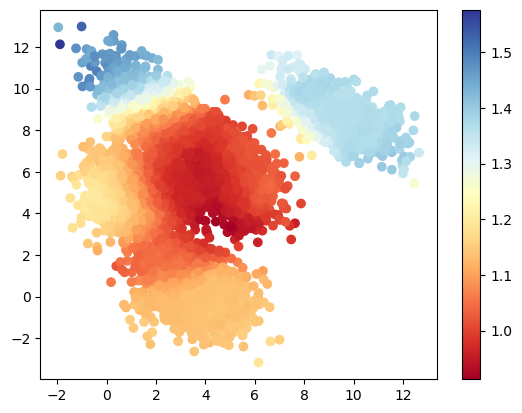

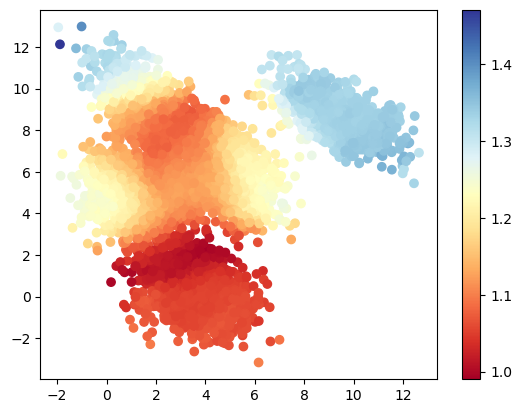

In [848]:
#label_dict = {0: 1292, 1: 1474, 2: 816, 3: 1251, 4: 868}


for i in range(5):
    rel_wasser_diffs = scan_by_cluster(center_covs[i], estimated_models)
    plt.figure()
    cm = plt.cm.get_cmap('RdYlBu')
    sc = plt.scatter(pts[:,0], pts[:,1],c=rel_wasser_diffs,cmap=cm)
    plt.colorbar(sc)

In [ ]:
def scan_by_cluster(base_model_idx, cov_seq):
    rel_wasser_diffs = []
    
    base_mean, base_cov = cov_seq[base_model_idx]
    for i in range(len(cov_seq)):
        (mean, cov) = cov_seq[i]
        rel_wasser_diffs.append(wasserstein_2(base_mean, mean, base_cov, cov))
        
    return rel_wasser_diffs

In [845]:
wasser_dist_matrix = construct_wasser_dist_matrix(estimated_models)

15151
Finished 1

KeyboardInterrupt: 

In [360]:
np.savez("2D_synthetic_Wasser_2", data=wasser_dist_matrix)

In [833]:
wasser_dist_matrix = np.load("2D_synthetic_Wasser_2.npz")["data"]

In [361]:
spatial_2D_dist_matrix = construct_2D_spatial_dist_matrix(pts)

5701


(array([ 335105.,  761752.,  709424.,  605788.,  572608.,  519762.,
         492440.,  458246.,  433216.,  410470.,  386602.,  369686.,
         357118.,  353282.,  342912.,  348742.,  345854.,  353692.,
         367300.,  380206.,  402274.,  429566.,  484010.,  538424.,
         629074.,  835926., 1404490., 1742806., 1411594., 1438526.,
        1512716., 1694920., 1832506., 1730136., 1452110., 1175876.,
        1087340., 1007758., 1006478.,  708378.,  267212.,  141248.,
         101144.,   88762.,  108246.,  123038.,  138180.,   87778.,
          14748.,    1932.]),
 array([0.        , 0.03158073, 0.06316146, 0.09474219, 0.12632292,
        0.15790366, 0.18948439, 0.22106512, 0.25264585, 0.28422658,
        0.31580731, 0.34738804, 0.37896877, 0.4105495 , 0.44213023,
        0.47371097, 0.5052917 , 0.53687243, 0.56845316, 0.60003389,
        0.63161462, 0.66319535, 0.69477608, 0.72635681, 0.75793754,
        0.78951828, 0.82109901, 0.85267974, 0.88426047, 0.9158412 ,
        0.94742193

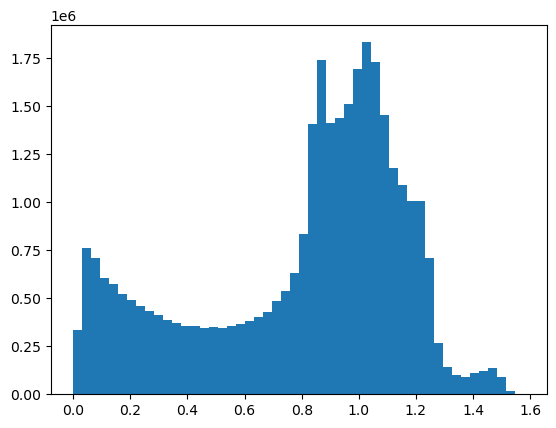

In [844]:
plt.hist(wasser_dist_matrix.flatten(),bins=50)

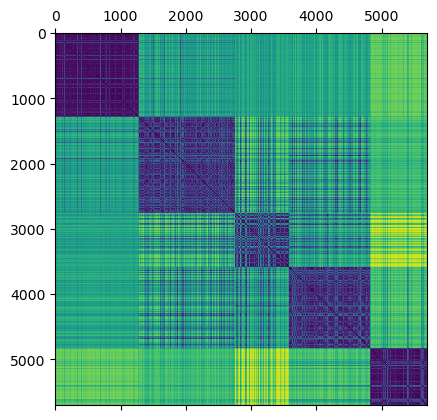

In [363]:
plt.matshow(wasser_dist_matrix)

(array([3.683895e+06, 5.372312e+06, 6.541526e+06, 6.469900e+06,
        4.304794e+06, 3.548132e+06, 2.120524e+06, 4.261440e+05,
        3.284600e+04, 1.328000e+03]),
 array([ 0.        ,  1.68266982,  3.36533964,  5.04800945,  6.73067927,
         8.41334909, 10.09601891, 11.77868873, 13.46135854, 15.14402836,
        16.82669818]),
 <BarContainer object of 10 artists>)

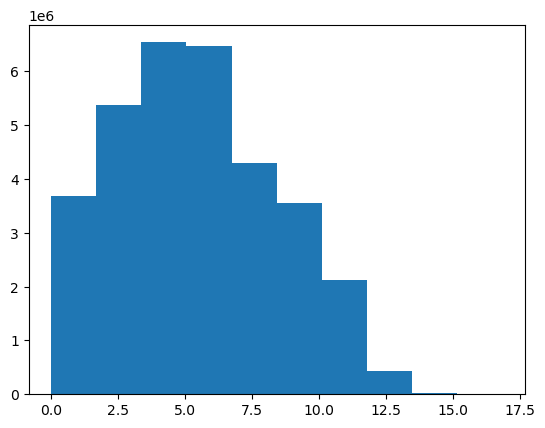

In [365]:
plt.hist(spatial_2D_dist_matrix.flatten())

In [684]:
sanity_spatial_matrix = np.zeros(spatial_2D_dist_matrix.shape)

for i, pt in enumerate(pts):
    dst = np.sqrt(np.sum(np.square(pt-pts), axis=1))
    sanity_spatial_matrix[i,:] = dst

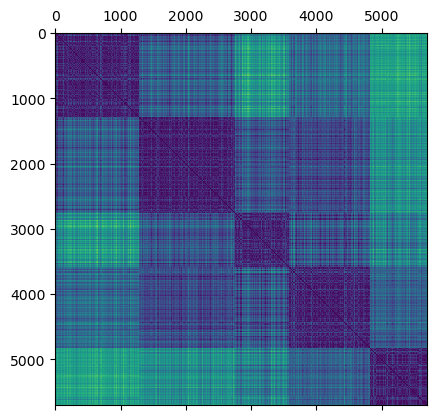

In [685]:
plt.matshow(sanity_spatial_matrix)

In [688]:
sanity_spatial_matrix

array([[ 0.        ,  2.62527079,  1.13856468, ..., 10.71596501,
        11.53609593, 11.73975449],
       [ 2.62527079,  0.        ,  2.2757195 , ..., 10.14470265,
        11.34403094, 10.81019852],
       [ 1.13856468,  2.2757195 ,  0.        , ...,  9.59951138,
        10.46964602, 10.60336023],
       ...,
       [10.71596501, 10.14470265,  9.59951138, ...,  0.        ,
         1.89125464,  1.76258822],
       [11.53609593, 11.34403094, 10.46964602, ...,  1.89125464,
         0.        ,  3.27071185],
       [11.73975449, 10.81019852, 10.60336023, ...,  1.76258822,
         3.27071185,  0.        ]])

In [882]:
spatial_2D_dist_matrix = construct_2D_spatial_dist_matrix(pts)

5701


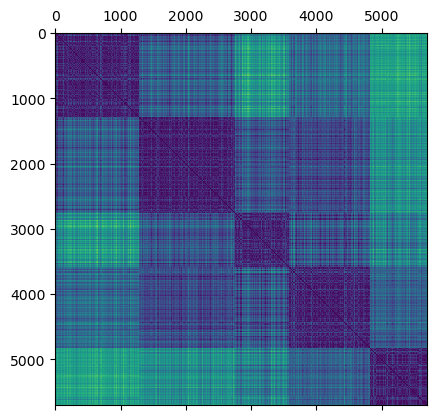

In [883]:
plt.matshow(spatial_2D_dist_matrix)

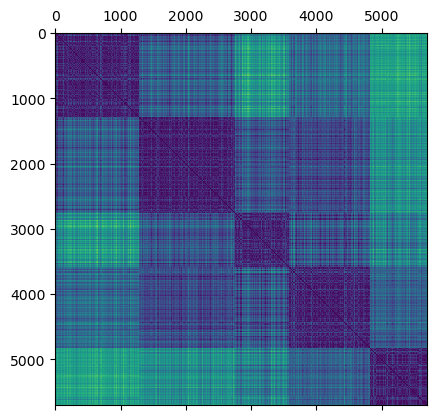

In [877]:
plt.matshow(sanity_spatial_matrix)

In [622]:
np.where(spatial_2D_dist_matrix<0)

(array([], dtype=int64), array([], dtype=int64))

In [606]:
spatial_2D_clustering = DBSCAN(eps=1.6, min_samples=450, metric="precomputed").fit(spatial_2D_dist_matrix)
Counter(spatial_2D_clustering.labels_)

Counter({0: 4776, -1: 85, 1: 840})

In [834]:
wasser_2D_clustering = DBSCAN(eps=0.15, min_samples=300, metric="precomputed").fit(wasser_dist_matrix)
Counter(wasser_2D_clustering.labels_)

Counter({0: 1226, -1: 573, 1: 1480, 2: 1191, 3: 398, 4: 833})

In [840]:
merged_labels = wasser_2D_clustering.labels_
merged_labels[merged_labels==-1] = 3

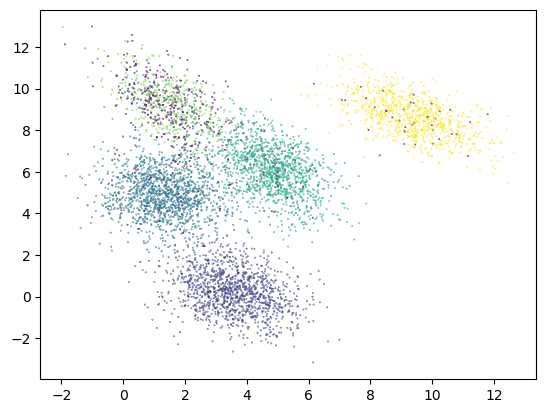

In [835]:
plt.scatter(pts[:,0], pts[:,1], c=wasser_2D_clustering.labels_, s=0.1)

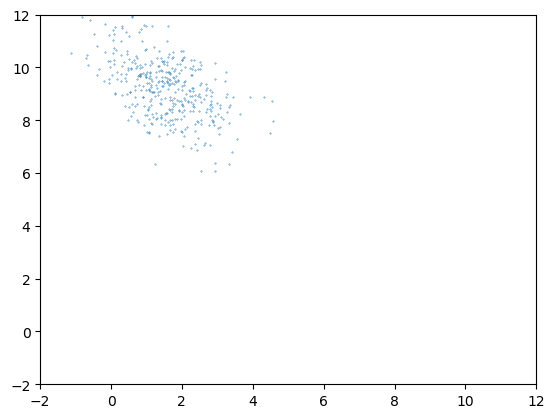

In [839]:
plt.xlim((-2,12))
plt.ylim((-2,12))

filtered = pts[wasser_2D_clustering.labels_ == 3]

plt.scatter(filtered[:,0], filtered[:,1], s=0.1)

In [501]:
labels = np.array(wasser_2D_clustering.labels_)
labels[labels==-1] = 3

In [841]:
compute_evaluation_metrics(lbs, merged_labels)

(0.842615483514249, 0.8220600826688219)

In [502]:
compute_evaluation_metrics(lbs, labels)

(0.842615483514249, 0.8220600826688219)

In [640]:
lam = 0.1

weighted_dist_matrix = wasser_dist_matrix + lam * spatial_2D_dist_matrix

In [627]:
print(np.mean(spatial_2D_dist_matrix[1292:1292+1474,1292:1292+1474]), np.mean(spatial_2D_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
print(np.mean(spatial_2D_dist_matrix[1292+1474:1292+1474+816,1292+1474:1292+1474+816]), np.mean(spatial_2D_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
print(np.mean(spatial_2D_dist_matrix[1292+1474+816:1292+1474+816+868,1292+1474+816:1292+1474+816+868]), np.mean(spatial_2D_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))

1.810886502277652 3.9873600519336287
2.1237149529230597 3.9873600519336287
1.7861880101073055 3.9873600519336287


In [619]:
#label_dict = {0: 1292, 1: 1474, 2: 816, 3: 1251, 4: 868}

print(np.mean(weighted_dist_matrix[1292:1292+1474,1292:1292+1474]), np.mean(weighted_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
print(np.mean(weighted_dist_matrix[1292+1474:1292+1474+816,1292+1474:1292+1474+816]), np.mean(weighted_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
print(np.mean(weighted_dist_matrix[1292+1474+816:1292+1474+816+868,1292+1474+816:1292+1474+816+868]), np.mean(weighted_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))

0.2857696277388612
0.4081878859011878
0.29385865626128993


0.1
0.8008890824098668 5.438878865573767
1.3447769689672453
-0.7000160158572951
-0.5494431971368818
-0.6941498516301975


<Figure size 640x480 with 0 Axes>

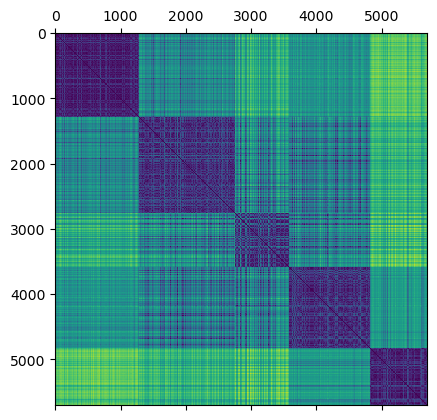

0.2
0.8008890824098668 5.438878865573767
1.8886648555246184
-0.9176633708228932
-0.7358077070379395
-0.9142670558128303


<Figure size 640x480 with 0 Axes>

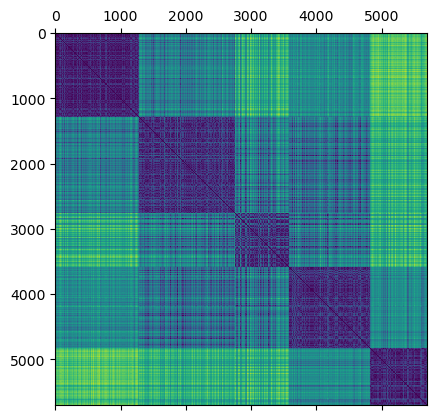

0.30000000000000004
0.8008890824098668 5.438878865573767
2.432552742081996
-1.1353107257884907
-0.9221722169389961
-1.1343842599954623


<Figure size 640x480 with 0 Axes>

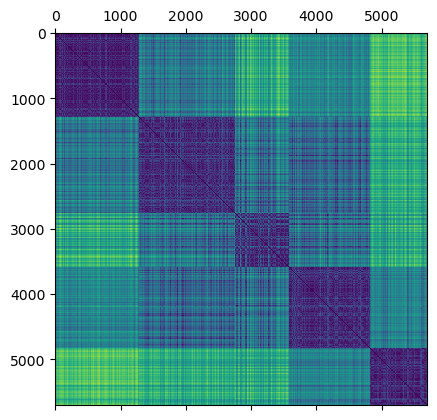

0.4
0.8008890824098668 5.438878865573767
2.97644062863938
-1.3529580807540909
-1.108536726840055
-1.3545014641780968


<Figure size 640x480 with 0 Axes>

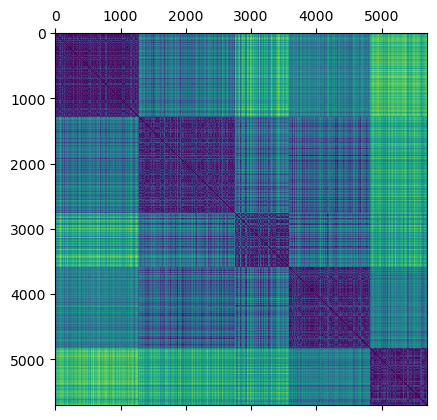

0.5
0.8008890824098668 5.438878865573767
3.520328515196745
-1.5706054357196821
-1.2949012367411057
-1.5746186683607226


<Figure size 640x480 with 0 Axes>

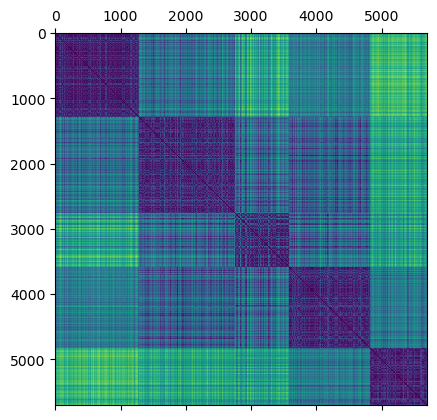

0.6
0.8008890824098668 5.438878865573767
4.064216401754126
-1.788252790685284
-1.4812657466421688
-1.7947358725433604


<Figure size 640x480 with 0 Axes>

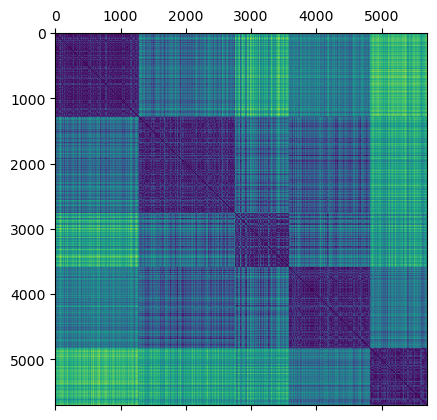

0.7000000000000001
0.8008890824098668 5.438878865573767
4.608104288311503
-2.0059001456508785
-1.6676302565432197
-2.0148530767259887


<Figure size 640x480 with 0 Axes>

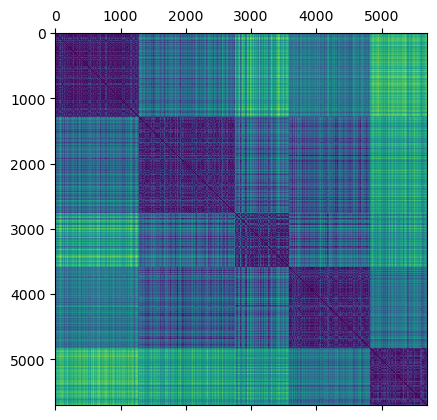

0.8
0.8008890824098668 5.438878865573767
5.151992174868866
-2.223547500616477
-1.8539947664442793
-2.2349702809086223


<Figure size 640x480 with 0 Axes>

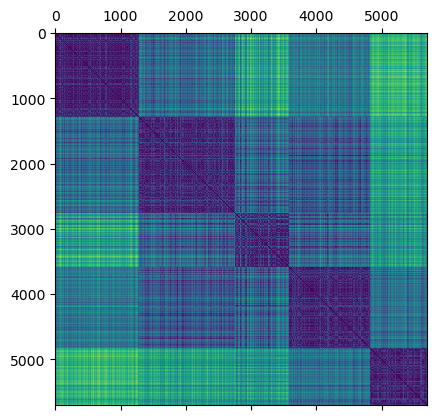

0.9
0.8008890824098668 5.438878865573767
5.695880061426254
-2.4411948555820735
-2.0403592763453333
-2.4550874850912514


<Figure size 640x480 with 0 Axes>

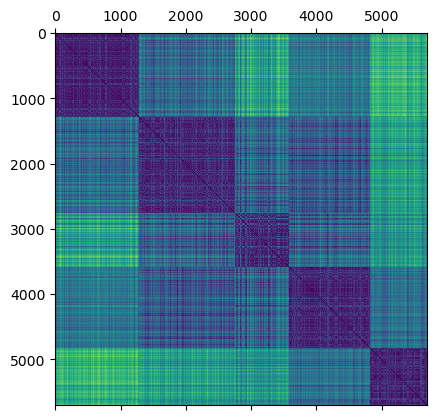

In [629]:
for lam in np.arange(1e-1,1,1e-1):
    print(lam)
    print(np.mean(wasser_dist_matrix), np.mean(spatial_2D_dist_matrix))
    weighted_dist_matrix = wasser_dist_matrix + lam * spatial_2D_dist_matrix
    print(np.mean(weighted_dist_matrix))
    print(np.mean(weighted_dist_matrix[1292:1292+1474,1292:1292+1474]) - np.mean(weighted_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
    print(np.mean(weighted_dist_matrix[1292+1474:1292+1474+816,1292+1474:1292+1474+816]) - np.mean(weighted_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
    print(np.mean(weighted_dist_matrix[1292+1474+816:1292+1474+816+868,1292+1474+816:1292+1474+816+868]) - np.mean(weighted_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
    plt.figure()
    plt.matshow(weighted_dist_matrix)
    plt.show()

0.8008890824098668 5.438878865573767
0.8008890824098668
0.267660762716085 0.7500294236077829
0.3869507363719573 0.7500294236077829
0.27599677616021695 0.7500294236077829


<Figure size 640x480 with 0 Axes>

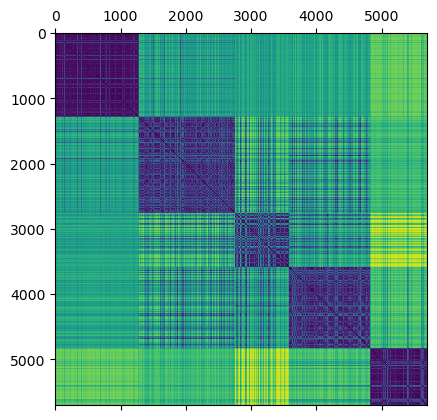

In [625]:
print(np.mean(wasser_dist_matrix), np.mean(spatial_2D_dist_matrix))
weighted_dist_matrix = wasser_dist_matrix + 0 * spatial_2D_dist_matrix
print(np.mean(weighted_dist_matrix))
print(np.mean(weighted_dist_matrix[1292:1292+1474,1292:1292+1474]), np.mean(weighted_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
print(np.mean(weighted_dist_matrix[1292+1474:1292+1474+816,1292+1474:1292+1474+816]), np.mean(weighted_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
print(np.mean(weighted_dist_matrix[1292+1474+816:1292+1474+816+868,1292+1474+816:1292+1474+816+868]), np.mean(weighted_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
plt.figure()
plt.matshow(weighted_dist_matrix)
plt.show()

0.8008890824098668 5.438878865573767
0.8063279612754409
0.2694716492183627 0.7540167836597171
0.38907445132488033 0.7540167836597171
0.27778296417032433 0.7540167836597171


<Figure size 640x480 with 0 Axes>

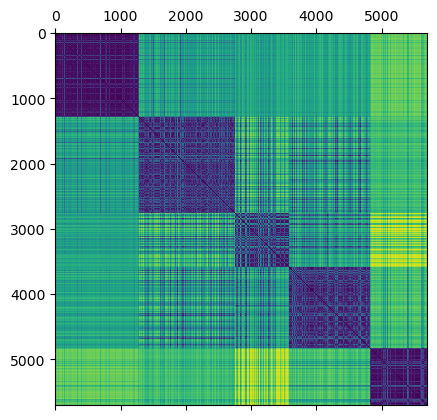

In [624]:

print(np.mean(wasser_dist_matrix), np.mean(spatial_2D_dist_matrix))
weighted_dist_matrix = wasser_dist_matrix + 0.001 * spatial_2D_dist_matrix
print(np.mean(weighted_dist_matrix))
print(np.mean(weighted_dist_matrix[1292:1292+1474,1292:1292+1474]), np.mean(weighted_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
print(np.mean(weighted_dist_matrix[1292+1474:1292+1474+816,1292+1474:1292+1474+816]), np.mean(weighted_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
print(np.mean(weighted_dist_matrix[1292+1474+816:1292+1474+816+868,1292+1474+816:1292+1474+816+868]), np.mean(weighted_dist_matrix[1292:1292+1474+816,1292+1474:1292+1474+816+868]))
plt.figure()
plt.matshow(weighted_dist_matrix)
plt.show()

(array([2.755533e+06, 3.218892e+06, 2.411322e+06, 2.966260e+06,
        5.615410e+06, 7.878392e+06, 4.431532e+06, 2.834244e+06,
        3.844280e+05, 5.388000e+03]),
 array([0.        , 0.30206746, 0.60413492, 0.90620238, 1.20826984,
        1.5103373 , 1.81240476, 2.11447222, 2.41653968, 2.71860714,
        3.0206746 ]),
 <BarContainer object of 10 artists>)

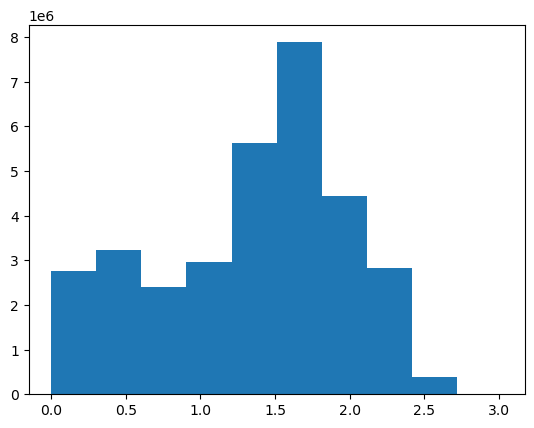

In [641]:
plt.hist(weighted_dist_matrix.flatten())

In [617]:
dbscan_cluster = DBSCAN(eps=0.5, min_samples=20).fit(pts)
Counter(dbscan_cluster.labels_)

Counter({0: 4698, -1: 196, 1: 807})

In [675]:
weighted_clustering = DBSCAN(eps=0.25, min_samples=300, metric="precomputed").fit(weighted_dist_matrix)
Counter(weighted_clustering.labels_)

Counter({0: 1237, -1: 595, 1: 2665, 2: 382, 3: 822})

In [676]:
compute_evaluation_metrics(lbs, weighted_clustering.labels_)

(0.607122213029781, 0.7239635468753699)

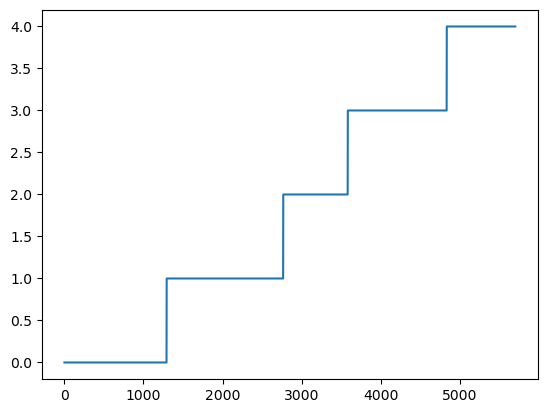

In [677]:
plt.plot(lbs)

In [695]:
results = []

for i in np.arange(0.10,0.20,0.01):
    for j in np.arange(200,400,10):
        weighted_dist_matrix = wasser_dist_matrix + 0.05 * spatial_2D_dist_matrix
        weighted_clustering = DBSCAN(eps=i, min_samples=j, metric="precomputed").fit(weighted_dist_matrix)
        ari, nmi = compute_evaluation_metrics(lbs, weighted_clustering.labels_)
        print(ari, nmi, i, j)
        results.append((ari, nmi, (i, j)))

0.6545109411692742 0.7311229000601497 0.1 200
0.6343199880489939 0.7277710914996298 0.1 210
0.6192866010699124 0.7220505263306135 0.1 220
0.5631279162950582 0.7020975171500815 0.1 230
0.5054562984103099 0.6786567425677449 0.1 240
0.48258611179648286 0.6683967782060026 0.1 250
0.4721588564778472 0.6628323758121261 0.1 260
0.4620292633869088 0.6572917391695735 0.1 270
0.45241324234982616 0.6531498824175989 0.1 280
0.41788467802689516 0.6380978220427556 0.1 290
0.4097050987085707 0.6335388064876503 0.1 300
0.40289767759182155 0.6297079070558923 0.1 310
0.395862077428711 0.6255868014027564 0.1 320
0.3866339629895748 0.6197603450864815 0.1 330
0.376509033360021 0.6129912643225557 0.1 340
0.3625292802024553 0.6027025546122718 0.1 350
0.35246032502090374 0.5935133899821106 0.1 360
0.353904721055118 0.5885662119088677 0.1 370
0.353904721055118 0.5885662119088677 0.1 380
0.35345216164925375 0.5881394539850887 0.1 390
0.7363222284397085 0.761322479913225 0.11 200
0.7217696000147132 0.75718525809

0.6068435328166498 0.7339928693605132 0.16999999999999998 330
0.6065786518079894 0.732247159043508 0.16999999999999998 340
0.6070961393940918 0.7323479718853698 0.16999999999999998 350
0.8256009123122038 0.8090140694067269 0.16999999999999998 360
0.8311466583665164 0.8122099064097618 0.16999999999999998 370
0.8436806734364849 0.8199126318394421 0.16999999999999998 380
0.8616667301732237 0.838258209990202 0.16999999999999998 390
0.612137387607752 0.7554704820335542 0.17999999999999997 200
0.6115121132645079 0.7521709313277344 0.17999999999999997 210
0.610574889731272 0.7502293345216814 0.17999999999999997 220
0.6104646218121762 0.749324531198539 0.17999999999999997 230
0.6104536250410487 0.7480836045639291 0.17999999999999997 240
0.611281551679062 0.7483474674021187 0.17999999999999997 250
0.6099492152794305 0.7460379673012257 0.17999999999999997 260
0.6096367765445445 0.7452297516927986 0.17999999999999997 270
0.6092581743990422 0.7447024398887354 0.17999999999999997 280
0.610461854100

In [696]:
for i in np.arange(0.15,0.20,0.01):
    for j in np.arange(400,450,10):
        weighted_dist_matrix = wasser_dist_matrix + 0.05 * spatial_2D_dist_matrix
        weighted_clustering = DBSCAN(eps=i, min_samples=j, metric="precomputed").fit(weighted_dist_matrix)
        ari, nmi = compute_evaluation_metrics(lbs, weighted_clustering.labels_)
        print(ari, nmi, i, j)
        results.append((ari, nmi, (i, j, lam)))

0.743071188129563 0.7843794763415894 0.15 400
0.7273786761693247 0.7802147703860831 0.15 410
0.7224166484158464 0.7784963506420277 0.15 420
0.7075939708596665 0.7712790678530892 0.15 430
0.6737041870242958 0.7591050903695749 0.15 440
0.8065797010591602 0.8084380226395014 0.16 400
0.7863194365328223 0.8004067737365683 0.16 410
0.7706036730048322 0.794719469270348 0.16 420
0.7620623061304097 0.7920708284650732 0.16 430
0.7548775418191432 0.7888506186287659 0.16 440
0.8535738565594249 0.8319334500081258 0.17 400
0.8453264611685941 0.8276182605721738 0.17 410
0.841838464294791 0.8270302173627236 0.17 420
0.8093003044091297 0.8119757985262781 0.17 430
0.8026795831862239 0.8081803964362227 0.17 440
0.839807421426329 0.824287585215574 0.18000000000000002 400
0.8548768253156949 0.8325280258657555 0.18000000000000002 410
0.8649184912223693 0.8404099138525288 0.18000000000000002 420
0.8647955882233097 0.8409950620664242 0.18000000000000002 430
0.866000118020788 0.841699398161872 0.18000000000000

In [889]:
for i in np.arange(0.20,0.80,0.05):
    for j in np.arange(200,300,10):
        weighted_dist_matrix = wasser_dist_matrix + 0.1 * spatial_2D_dist_matrix
        weighted_clustering = DBSCAN(eps=i, min_samples=j, metric="precomputed").fit(weighted_dist_matrix)
        ari, nmi = compute_evaluation_metrics(lbs, weighted_clustering.labels_)
        print(ari, nmi, i, j)

0.4596945265902166 0.6645935131434281 0.2 200
0.425011348957094 0.6454504983019136 0.2 210
0.40821562033162523 0.6356058812443305 0.2 220
0.3899584664902435 0.6241436406001757 0.2 230
0.37431434634447114 0.6126075876869983 0.2 240
0.3618448969767145 0.602110946627044 0.2 250
0.3508025535819612 0.5895288335874622 0.2 260
0.3470844926667226 0.5860644187799654 0.2 270
0.3475358190035853 0.5811950267356144 0.2 280
0.3434138666316399 0.5770534872533521 0.2 290
0.8543819425560911 0.8547570381950502 0.25 200
0.8437292290581361 0.8477835120473853 0.25 210
0.8350682224218425 0.8424550666243924 0.25 220
0.8263656987261863 0.8378125605572458 0.25 230
0.7990051280945479 0.8229925418804069 0.25 240
0.7876475463439798 0.8171616538658601 0.25 250
0.7731779402450282 0.8097803411461463 0.25 260
0.7602249938142842 0.8035423013514881 0.25 270
0.7394888731215902 0.8015736171562176 0.25 280
0.7251119550889876 0.7938975366873322 0.25 290
0.9299425239857235 0.9090854470303543 0.3 200
0.9288640293701929 0.908

In [891]:
for i in np.arange(0.20,0.80,0.05):
    for j in np.arange(50,200,10):
        weighted_dist_matrix = wasser_dist_matrix + 0.1 * spatial_2D_dist_matrix
        weighted_clustering = DBSCAN(eps=i, min_samples=j, metric="precomputed").fit(weighted_dist_matrix)
        ari, nmi = compute_evaluation_metrics(lbs, weighted_clustering.labels_)
        print(ari, nmi, i, j)

0.8763260307349016 0.8658462223202742 0.2 50
0.8582462058465797 0.8536254938825885 0.2 60
0.8433253022852361 0.8439949967473608 0.2 70
0.8266947909276575 0.8340185255928148 0.2 80
0.8038480671070306 0.8215985280623054 0.2 90
0.7774255664657355 0.8068219649939943 0.2 100
0.7613046639428097 0.7981526850579213 0.2 110
0.7213221230695216 0.7788502008503319 0.2 120
0.6895039749764448 0.7638331499004616 0.2 130
0.6577343327642671 0.7497046732437433 0.2 140
0.6345766587462535 0.7391575935663814 0.2 150
0.6026349274334712 0.7253501848212281 0.2 160
0.5686446558995758 0.7100263650028786 0.2 170
0.5294173584406007 0.6928726200251333 0.2 180
0.4699146380911866 0.6699232580217792 0.2 190
0.6775364890915092 0.8178883639884535 0.25 50
0.6742928707005476 0.8117111367458831 0.25 60
0.6693866186372386 0.8051914612285305 0.25 70
0.6641734702908669 0.7981233357515316 0.25 80
0.6593259759260396 0.7915212357177064 0.25 90
0.6541585821849754 0.7846731866779284 0.25 100
0.9098643207112459 0.8912473592165463 

0.0 0.0 0.7499999999999998 80
0.0 0.0 0.7499999999999998 90
0.0 0.0 0.7499999999999998 100
0.0 0.0 0.7499999999999998 110
0.0 0.0 0.7499999999999998 120
0.0 0.0 0.7499999999999998 130
0.0 0.0 0.7499999999999998 140
0.0 0.0 0.7499999999999998 150
0.0 0.0 0.7499999999999998 160
0.0 0.0 0.7499999999999998 170
0.0 0.0 0.7499999999999998 180
0.0 0.0 0.7499999999999998 190
0.0 0.0 0.7999999999999998 50
0.0 0.0 0.7999999999999998 60
0.0 0.0 0.7999999999999998 70
0.0 0.0 0.7999999999999998 80
0.0 0.0 0.7999999999999998 90
0.0 0.0 0.7999999999999998 100
0.0 0.0 0.7999999999999998 110
0.0 0.0 0.7999999999999998 120
0.0 0.0 0.7999999999999998 130
0.0 0.0 0.7999999999999998 140
0.0 0.0 0.7999999999999998 150
0.0 0.0 0.7999999999999998 160
0.0 0.0 0.7999999999999998 170
0.0 0.0 0.7999999999999998 180
0.0 0.0 0.7999999999999998 190


In [890]:
for i in np.arange(0.50,0.80,0.05):
    for j in np.arange(100,300,10):
        weighted_dist_matrix = wasser_dist_matrix + 0.5 * spatial_2D_dist_matrix
        weighted_clustering = DBSCAN(eps=i, min_samples=j, metric="precomputed").fit(weighted_dist_matrix)
        ari, nmi = compute_evaluation_metrics(lbs, weighted_clustering.labels_)
        print(ari, nmi, i, j)

0.7693622030045814 0.8022354082060166 0.5 100
0.7344440881671203 0.7839627031929661 0.5 110
0.6989077268570214 0.7646411386716269 0.5 120
0.658632480124118 0.7444932604348073 0.5 130
0.6292230316404799 0.7350320690845344 0.5 140
0.5903622667529638 0.715266569944029 0.5 150
0.548294060671771 0.6940571673973437 0.5 160
0.4942308659442532 0.6674963848401245 0.5 170
0.4456823444897716 0.6421492431631196 0.5 180
0.40602892338351054 0.6209239768119282 0.5 190
0.36928489606853593 0.5995021456934986 0.5 200
0.33265946415952624 0.5778801737693113 0.5 210
0.28511113870229327 0.5458418684785878 0.5 220
0.2354925110367681 0.5085802030611257 0.5 230
0.19908405875049018 0.4731731188055034 0.5 240
0.1727007034478697 0.428947515689613 0.5 250
0.15093877454361002 0.39604564898054206 0.5 260
0.125774773894034 0.31928456529263294 0.5 270
0.11470801514166637 0.30417730689571654 0.5 280
0.10421808356364368 0.28955932690015623 0.5 290
0.8614121528599991 0.8554418632823325 0.55 100
0.8493656252415466 0.84741

In [ ]:
for i in np.arange(0.20,0.80,0.05):
    for j in np.arange(200,300,10):
        weighted_dist_matrix = wasser_dist_matrix + 0.1 * spatial_2D_dist_matrix
        weighted_clustering = DBSCAN(eps=i, min_samples=j, metric="precomputed").fit(weighted_dist_matrix)
        ari, nmi = compute_evaluation_metrics(lbs, weighted_clustering.labels_)
        print(ari, nmi, i, j)

In [681]:
results = []

for i in np.arange(0.10,0.25,0.01):
    for j in np.arange(50,400,10):
        
        wasser_clustering = DBSCAN(eps=i, min_samples=j, metric="precomputed").fit(wasser_dist_matrix)
        ari, nmi = compute_evaluation_metrics(lbs, wasser_clustering.labels_)
        if 

(0.6187175017876698, 0.7412730627433243)
(0.6119488541932594, 0.7313922553276276)
(0.6061194656197804, 0.7244500163621952)
(0.6041910063387606, 0.7204183980834512)
(0.6036146459576255, 0.7178042160038701)
(0.599503881926817, 0.7117277928804698)
(0.5974237047594457, 0.7085849136626475)
(0.5922164980405803, 0.7024161788305371)
(0.5872274258041716, 0.6971091844540663)
(0.5813836322304541, 0.6908815964852709)
(0.5777774404302466, 0.6870984387801862)
(0.7603404476343514, 0.7682308084967555)
(0.7077359483473483, 0.7491659889886598)
(0.6871487330159943, 0.744278477316649)
(0.6674472641372936, 0.7359518239010852)
(0.6545109411692742, 0.7311229000601497)
(0.6343199880489939, 0.7277710914996298)
(0.6192866010699124, 0.7220505263306135)
(0.5631279162950582, 0.7020975171500815)
(0.5054562984103099, 0.6786567425677449)
(0.48258611179648286, 0.6683967782060026)
(0.4721588564778472, 0.6628323758121261)
(0.4620292633869088, 0.6572917391695735)
(0.45241324234982616, 0.6531498824175989)
(0.4178846780268

(0.8315504088386754, 0.8100876817789231)
(0.8306370353556501, 0.8099901802239392)
(0.8259110333803737, 0.8067012583215716)
(0.8166148860386848, 0.8018378436026032)
(0.804452983066291, 0.7971759624932704)
(0.7923185400778154, 0.7944546475297386)
(0.7742181809522997, 0.7950283439543188)
(0.7624965542620199, 0.7901505081262715)
(0.7467829514204182, 0.785661683771066)
(0.16827796943655446, 0.4136947968218285)
(0.16854168869450945, 0.4126446801672099)
(0.464346612766257, 0.6949958814760452)
(0.4641804788065526, 0.6961890402274931)
(0.4642613766053831, 0.6929995008285665)
(0.619018637002833, 0.7685377408921481)
(0.6230930264632976, 0.7700913986992624)
(0.6231103150066101, 0.7675905313383422)
(0.6219503200280584, 0.7630556728248192)
(0.6150150446652002, 0.7521217845541551)
(0.6138140293979284, 0.7496725760979667)
(0.6126832789431117, 0.7470191473100511)
(0.6099198639148988, 0.7425073530331717)
(0.6104241223539886, 0.7426516745377424)
(0.6118177479594139, 0.7428836493548583)
(0.609903590517079

(0.6076138102457538, 0.7661152538244087)
(0.6077383725329837, 0.763965698205302)
(0.6081324707602791, 0.7630142590308261)
(0.6066050233792285, 0.7609930826153118)
(0.6064819857436341, 0.7605743935111795)
(0.6054676968372495, 0.7578160447617348)
(0.6064936279631117, 0.7575135206117843)
(0.6073255419199304, 0.7569023511169475)
(0.6070229779106519, 0.7560057642719351)
(0.6078864806574045, 0.7565162775368406)
(0.6082922540856937, 0.7563628121911796)
(0.6074741698394933, 0.7545779757602454)
(0.6079768885341724, 0.7548536826834411)
(0.6072075920882662, 0.7536566485223735)
(0.6077813012749024, 0.7537591081554952)
(0.606380442913661, 0.7516300056052844)
(0.6072210492889579, 0.7521460053805517)
(0.6087755874464755, 0.7531761967025449)
(0.1686928258117048, 0.4180942675162925)
(0.1686928258117048, 0.4180942675162925)
(0.16856956830062186, 0.4176512502115604)
(0.16856956830062186, 0.4176512502115604)
(0.168570376105811, 0.41730153867816017)
(0.16861303666699148, 0.41789290428346687)
(0.16861303666

In [821]:
np.savez("synthetic_map", data=synthetic_map)

In [825]:
np.savez("synthetic_pts", data=pts)

In [823]:
kmeans_clustering = KMeans(n_clusters=5, n_init="auto").fit(synthetic_map)

compute_evaluation_metrics(lbs, kmeans_clustering.labels_)

(0.012622037720718375, 0.01664168761849674)

In [826]:
cosine_2D_dist_matrix = construct_feature_dist_matrix(synthetic_map)

In [827]:
np.savez("cosine_2D_dist_matrix", data=cosine_2D_dist_matrix)

In [917]:
sticc_labels = np.loadtxt("sticc_cf_synthetic_result.txt")

In [918]:
compute_evaluation_metrics(cflbs, sticc_labels)

(0.5115286655217061, 0.5266081672546394)

In [893]:
sticc_labels = np.loadtxt("sticc_synthetic_result_beta_0.txt")

In [894]:
compute_evaluation_metrics(lbs, sticc_labels)

(0.9127725005276363, 0.892828030021228)

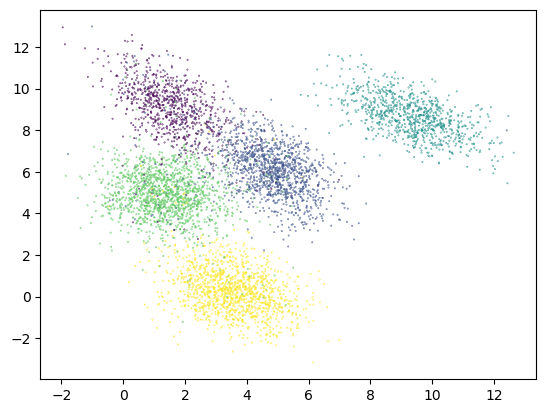

In [895]:
plt.scatter(pts[:,0], pts[:,1], c=sticc_labels, s=0.1)

In [853]:
hdbscan_labels = np.load("hdbscan-2d-clustering-result.npz")["data"]

In [854]:
compute_evaluation_metrics(lbs, hdbscan_labels)

(0.010035419000922587, 0.013886079499248702)

In [849]:
synthetic_map = generate_synthetic_2D_samples(10*cluster_centers, center_covs, pts, lbs, 1, alpha)

13.808165028784801 13
(479,)
(607,)
(190,)


C:\Users\zhang\AppData\Local\Temp\ipykernel_6240\707590718.py:18: RuntimeWarning: covariance is not positive-semidefinite.
  random_sample = np.random.multivariate_normal(mean=[0,0,0,0,0], cov=random_cov, size=pt_bin.shape[0])


(14,)
(2,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 0
11.718256811010887 11
(574,)
(697,)
(183,)
(20,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 1
13.202802050815595 13
(331,)
(350,)
(107,)
(23,)
(4,)
(1,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 2
9.645500336576452 9
(482,)
(544,)
(188,)
(36,)
(1,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 3
13.32064805147651 13
(353,)
(361,)
(122,)
(31,)
(1,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 4


In [850]:
glasso = GraphicalLasso(alpha=0.01, max_iter=1000)

radius = 3
estimated_models = []

for i, pt in enumerate(pts):
    pt_dst = euclidean_dist(pt, pts)
    data = synthetic_map[pt_dst<radius]
    if data.shape[0] < 50:
        data = synthetic_map[pt_dst<2*radius]
    #print(data.shape)
    fit = glasso.fit(data)
    estimated_models.append((fit.location_, fit.covariance_))

C:\Users\zhang\AppData\Local\Temp\ipykernel_6240\3118075209.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('RdYlBu')


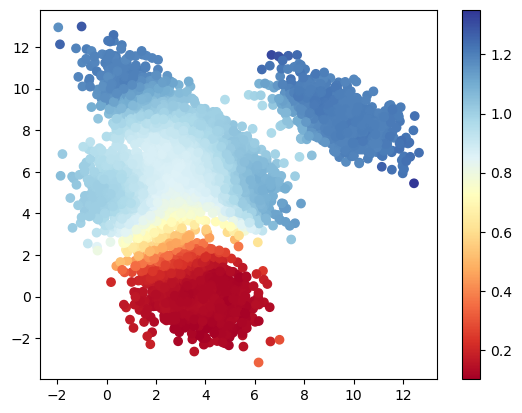

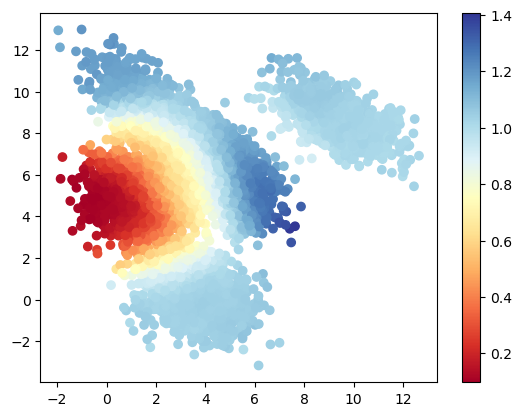

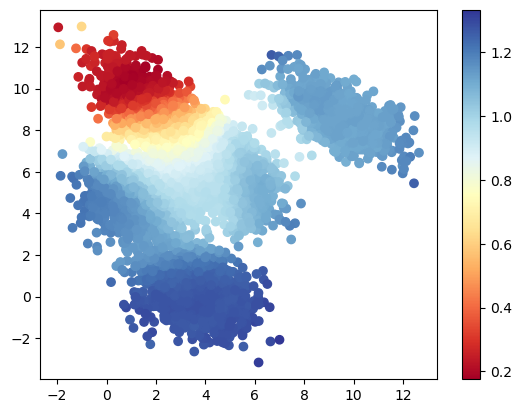

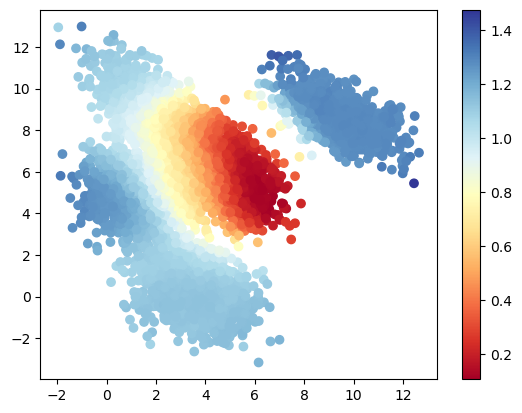

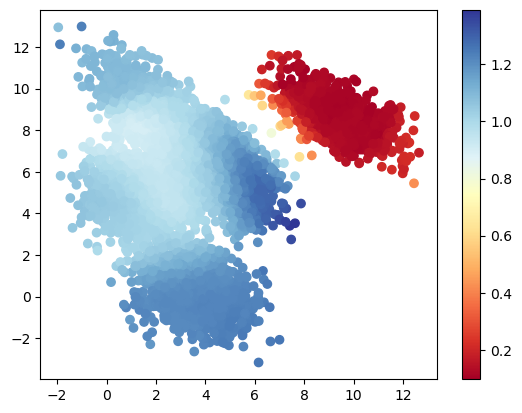

In [851]:
for i in range(5):
    rel_wasser_diffs = scan_by_cluster(center_covs[i], estimated_models)
    plt.figure(figsize=(15,15))
    cm = plt.cm.get_cmap('RdYlBu')
    sc = plt.scatter(pts[:,0], pts[:,1],c=rel_wasser_diffs,cmap=cm)
    plt.colorbar(sc)

In [924]:
wasser_dist_matrix = construct_wasser_dist_matrix(estimated_models)

5701
Finished 5700

(array([4.013241e+06, 5.674758e+06, 7.472246e+06, 6.316438e+06,
        4.134192e+06, 3.501364e+06, 1.279136e+06, 1.061020e+05,
        3.826000e+03, 9.800000e+01]),
 array([ 0.        ,  1.80376232,  3.60752465,  5.41128697,  7.21504929,
         9.01881162, 10.82257394, 12.62633626, 14.43009859, 16.23386091,
        18.03762323]),
 <BarContainer object of 10 artists>)

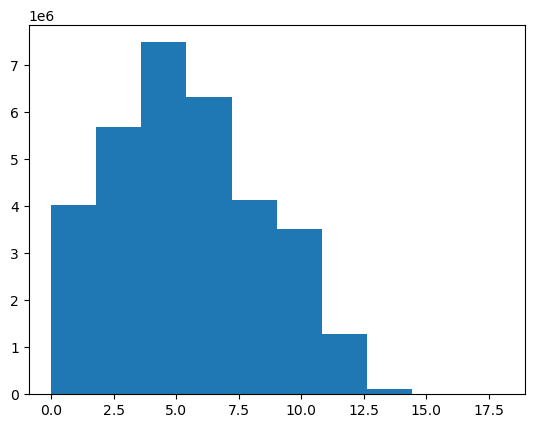

In [885]:
plt.hist(spatial_2D_dist_matrix.flatten())

In [886]:
for i in np.arange(0.1,1.0,0.1):
    for j in np.arange(50,200,10):
        pure_spatial = DBSCAN(eps=i, min_samples=j).fit(pts)
        ari, mni = compute_evaluation_metrics(lbs, pure_spatial.labels_)
        print(ari, mni, i, j)

0.0 0.0 0.1 50
0.0 0.0 0.1 60
0.0 0.0 0.1 70
0.0 0.0 0.1 80
0.0 0.0 0.1 90
0.0 0.0 0.1 100
0.0 0.0 0.1 110
0.0 0.0 0.1 120
0.0 0.0 0.1 130
0.0 0.0 0.1 140
0.0 0.0 0.1 150
0.0 0.0 0.1 160
0.0 0.0 0.1 170
0.0 0.0 0.1 180
0.0 0.0 0.1 190
0.0 0.0 0.2 50
0.0 0.0 0.2 60
0.0 0.0 0.2 70
0.0 0.0 0.2 80
0.0 0.0 0.2 90
0.0 0.0 0.2 100
0.0 0.0 0.2 110
0.0 0.0 0.2 120
0.0 0.0 0.2 130
0.0 0.0 0.2 140
0.0 0.0 0.2 150
0.0 0.0 0.2 160
0.0 0.0 0.2 170
0.0 0.0 0.2 180
0.0 0.0 0.2 190
0.04615762407089398 0.32322511315327507 0.30000000000000004 50
0.003682325711751486 0.2052573968200518 0.30000000000000004 60
-0.005383677468722271 0.09818699109147161 0.30000000000000004 70
0.0 0.0 0.30000000000000004 80
0.0 0.0 0.30000000000000004 90
0.0 0.0 0.30000000000000004 100
0.0 0.0 0.30000000000000004 110
0.0 0.0 0.30000000000000004 120
0.0 0.0 0.30000000000000004 130
0.0 0.0 0.30000000000000004 140
0.0 0.0 0.30000000000000004 150
0.0 0.0 0.30000000000000004 160
0.0 0.0 0.30000000000000004 170
0.0 0.0 0.30000000000

In [872]:
Counter(pure_spatial.labels_)

Counter({-1: 5701})

## Generate Very Confusing Dataset

In [899]:
cfpts, cflbs = generate_synthetic_2D_points(5*cluster_centers, pos_covs, cluster_sizes)

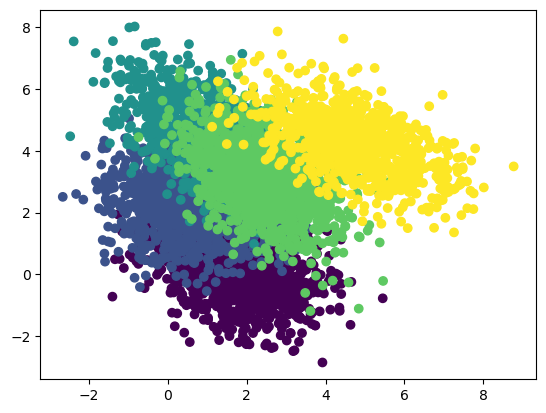

In [900]:
plt.scatter(cfpts[:,0], cfpts[:,1], c=cflbs)

In [902]:
cf_synthetic_map = generate_synthetic_2D_samples(5*cluster_centers, center_covs, cfpts, cflbs, 1, 0.03)

8.496527770284466 8
(515,)
(604,)
(158,)


C:\Users\zhang\AppData\Local\Temp\ipykernel_6240\707590718.py:18: RuntimeWarning: covariance is not positive-semidefinite.
  random_sample = np.random.multivariate_normal(mean=[0,0,0,0,0], cov=random_cov, size=pt_bin.shape[0])


(14,)
(1,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 0
8.156749420444664 8
(579,)
(678,)
(198,)
(19,)
(0,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 1
8.090007779866744 8
(298,)
(360,)
(135,)
(22,)
(1,)
(0,)
(0,)
(0,)
(0,)
Finished Cluster 2
6.5865423894606785 6
(483,)
(575,)
(157,)
(32,)
(4,)
(0,)
(0,)
Finished Cluster 3
7.9076542392482505 7
(320,)
(377,)
(130,)
(39,)
(2,)
(0,)
(0,)
(0,)
Finished Cluster 4


In [903]:
gm_clustering = GaussianMixture(n_components=5, random_state=10).fit(cfpts)
gm_labels = gm_clustering.predict(cfpts)
compute_evaluation_metrics(cflbs, gm_labels)

(0.4948488358430028, 0.5249194193232801)

In [919]:
glasso = GraphicalLasso(alpha=0.01, max_iter=1000)

radius = 3
cf_estimated_models = []

for i, pt in enumerate(cfpts):
    pt_dst = euclidean_dist(pt, cfpts)
    data = cf_synthetic_map[pt_dst<radius]
    if data.shape[0] < 50:
        data = sanity_map[pt_dst<2*radius]
    #print(data.shape)
    fit = glasso.fit(data)
    cf_estimated_models.append((fit.location_, fit.covariance_))

C:\Users\zhang\AppData\Local\Temp\ipykernel_6240\653027756.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('RdYlBu')


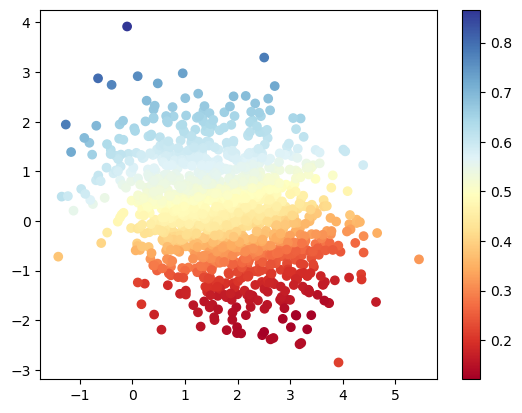

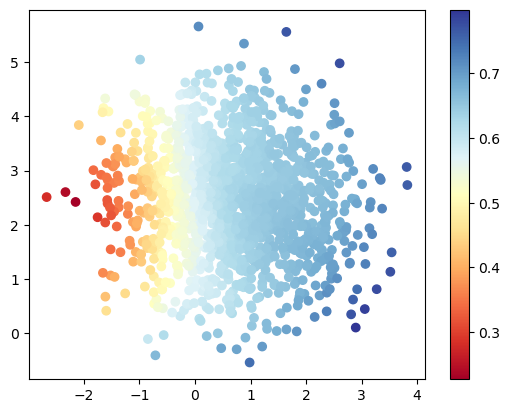

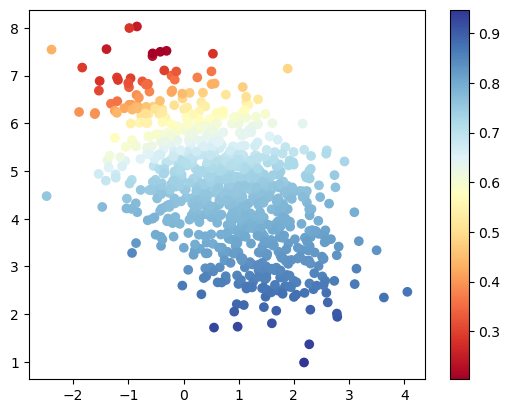

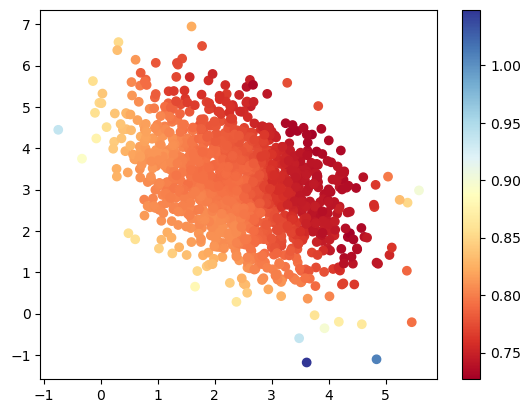

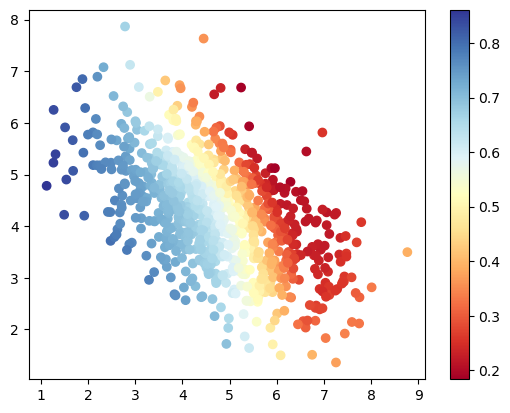

In [923]:
for i in range(5):
    rel_wasser_diffs = scan_by_cluster(center_covs[i], cf_estimated_models)
    plt.figure()
    cm = plt.cm.get_cmap('RdYlBu')
    idx = np.where(lbs==i)[0]
    sc = plt.scatter(cfpts[idx][:,0], cfpts[idx][:,1],c=np.array(rel_wasser_diffs)[idx],cmap=cm)
    plt.colorbar(sc)

In [908]:
np.savez("cf_synthetic_map", data=cf_synthetic_map)

In [909]:
np.savez("cf_synthetic_pts", data=cfpts)

In [ ]:
cf_wasser_dist_matrix = construct_wasser_dist_matrix(cf_estimated_models)